In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
print(os.listdir("training photos folder here"))

In [ ]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

There are 8727 pictures of shirts.


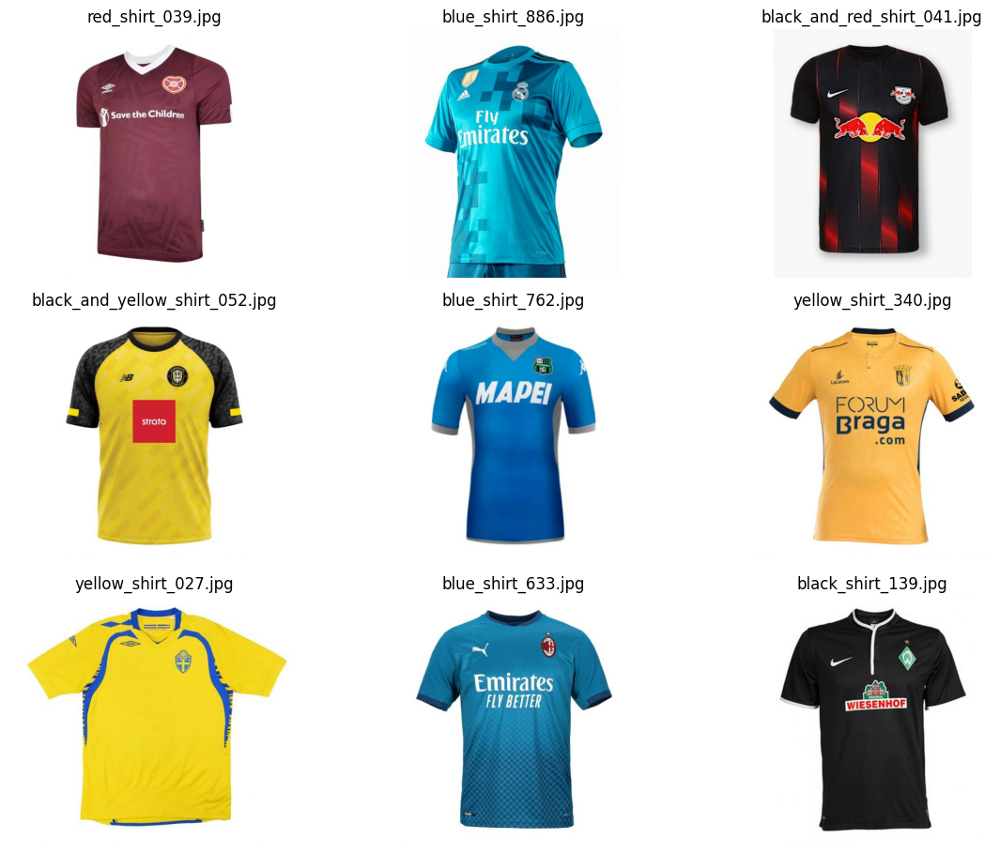

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

PATH = r'photosfolderhere'
images = os.listdir(PATH)
print(f'There are {len(images)} pictures of shirts.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(images))
    img_path = os.path.join(PATH, images[rnd_indx]) 
    img = plt.imread(img_path)                    
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [ ]:
import os

def check_images(root_path):
    for dirname, _, filenames in os.walk(root_path):
        print(f"Directory: {dirname}")
        for filename in filenames:
            print(f"  File: {filename}")

check_images(r'photosfolderhere')


Streaming output truncated to the last 5000 lines.
  File: black_shirt_400.jpg
  File: black_and_red_shirt_278.jpg
  File: red_and_white_shirt_621.jpg
  File: black_and_red_shirt_268.jpg
  File: white_shirt_659.jpg
  File: black_and_white_shirt_152.jpg
  File: blue_and_white_shirt_519.jpg
  File: black_and_blue_shirt_180.jpg
  File: red_and_white_shirt_086.jpg
  File: red_and_white_shirt_319.jpg
  File: black_and_yellow_shirt_063.jpg
  File: yellow_shirt_334.jpg
  File: blue_and_red_shirt_113.jpg
  File: green_shirt_084.jpg
  File: green_shirt_204.jpg
  File: blue_and_white_shirt_030.jpg
  File: orange_shirt_020.jpg
  File: blue_shirt_087.jpg
  File: blue_shirt_984.jpg
  File: red_and_white_shirt_033.jpg
  File: blue_and_white_shirt_073.jpg
  File: red_and_white_shirt_591.jpg
  File: red_and_white_shirt_276.jpg
  File: red_and_white_shirt_079.jpg
  File: green_and_white_shirt_214.jpg
  File: blue_shirt_638.jpg
  File: blue_shirt_706.jpg
  File: yellow_shirt_022.jpg
  File: green_and_ye

In [ ]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('training photos folder here', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

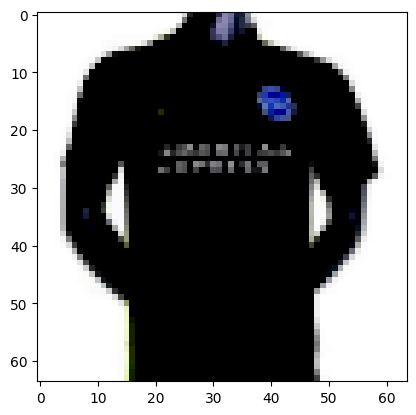

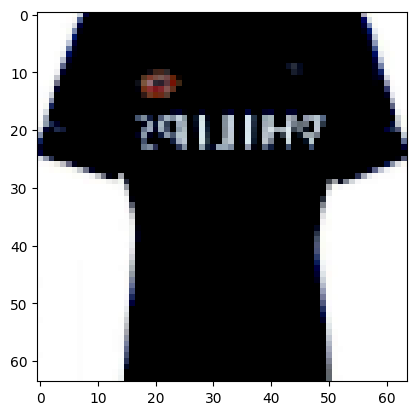

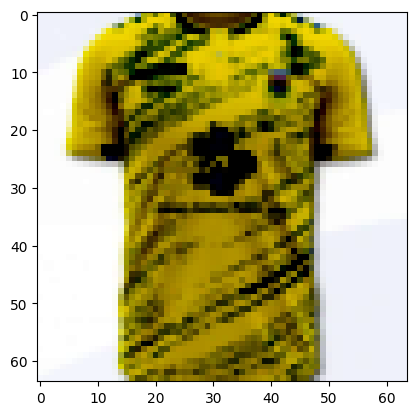

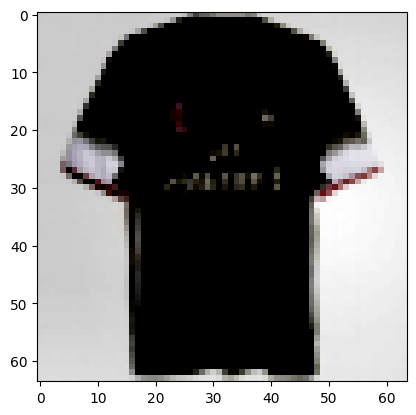

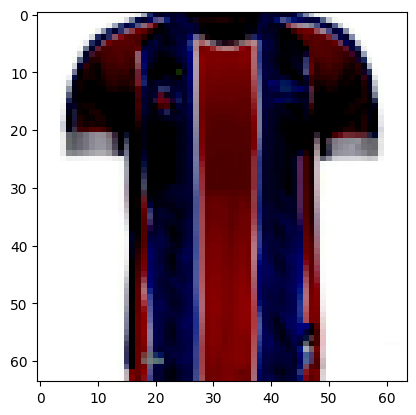

In [ ]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

# Weights

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [ ]:
class G(nn.Module):
    def __init__(self):
        super(G, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )

    def forward(self, input):
        output = self.main(input)
        return output

netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [ ]:
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )

    def forward(self, input):
        output = self.main(input)
        return output.view(-1)

netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

# Training

In [ ]:
!mkdir results
!ls

drive  results	sample_data


In [ ]:
EPOCH = 0
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [ ]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [ ]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [ ]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)

    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)

    plt.show()
    plt.close()

### Training Loop

<ipython-input-21-066ce1ecac15>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/275 [00:00<?, ?it/s]

[1/100][137/275] Loss_D: 1.2902 Loss_G: 1.5274 D(x): 0.6052 D(G(z)): 0.4988 / 0.1993
[1/100][274/275] Loss_D: 1.2029 Loss_G: 1.3876 D(x): 0.4938 D(G(z)): 0.3642 / 0.2284


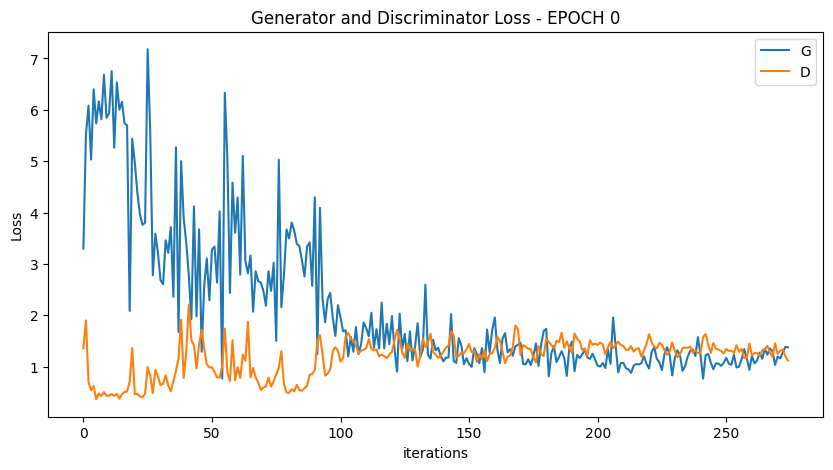

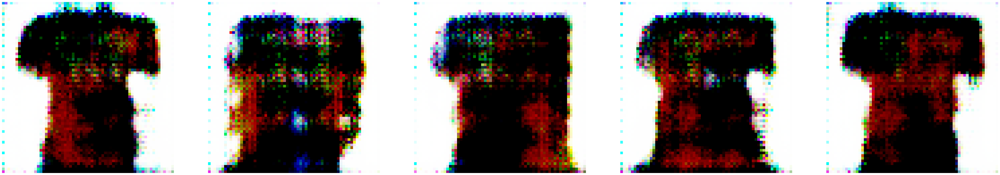

  0%|          | 0/275 [00:00<?, ?it/s]

[2/100][137/275] Loss_D: 1.2505 Loss_G: 1.0004 D(x): 0.3570 D(G(z)): 0.1824 / 0.3657
[2/100][274/275] Loss_D: 1.2922 Loss_G: 1.6992 D(x): 0.3799 D(G(z)): 0.2496 / 0.1739


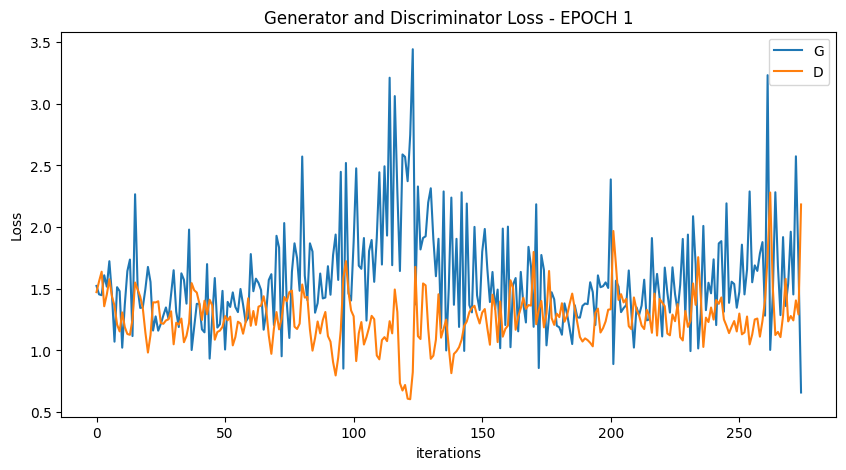

  0%|          | 0/275 [00:00<?, ?it/s]

[3/100][137/275] Loss_D: 1.2160 Loss_G: 1.5290 D(x): 0.4774 D(G(z)): 0.3301 / 0.2100
[3/100][274/275] Loss_D: 1.2363 Loss_G: 1.3683 D(x): 0.4834 D(G(z)): 0.3509 / 0.2400


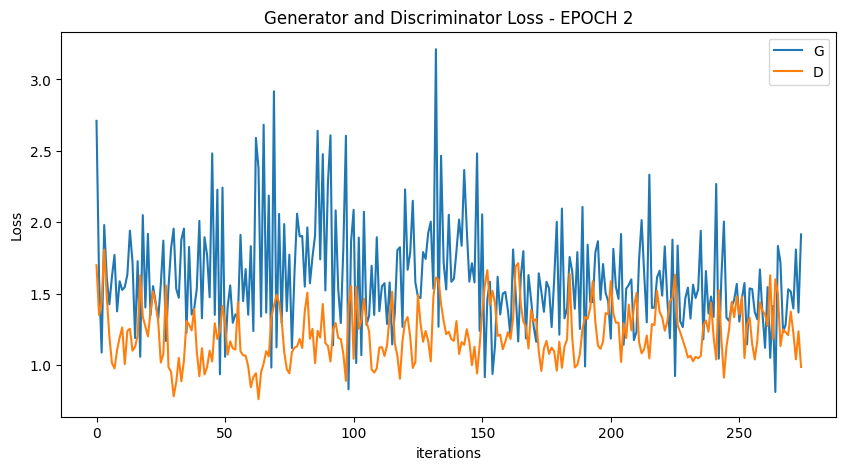

  0%|          | 0/275 [00:00<?, ?it/s]

[4/100][137/275] Loss_D: 1.1571 Loss_G: 1.5209 D(x): 0.5880 D(G(z)): 0.3945 / 0.2113
[4/100][274/275] Loss_D: 1.0312 Loss_G: 1.6650 D(x): 0.4781 D(G(z)): 0.2091 / 0.1737


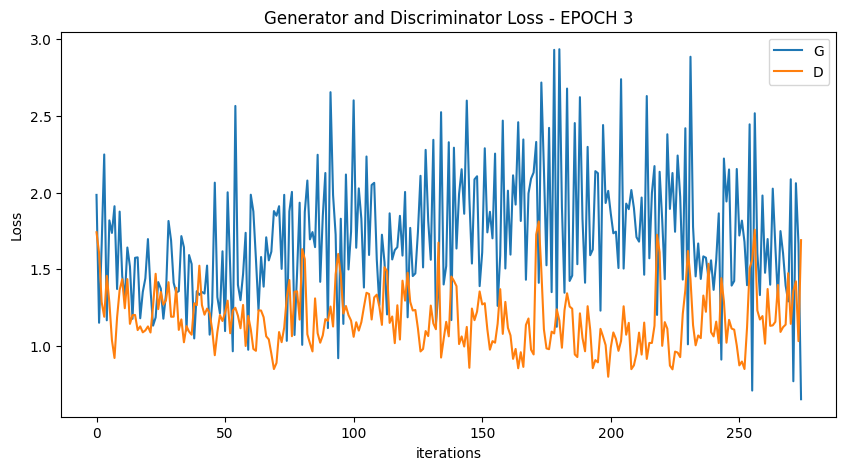

  0%|          | 0/275 [00:00<?, ?it/s]

[5/100][137/275] Loss_D: 1.0864 Loss_G: 1.6007 D(x): 0.5496 D(G(z)): 0.3346 / 0.1836
[5/100][274/275] Loss_D: 1.0783 Loss_G: 1.4584 D(x): 0.5141 D(G(z)): 0.2802 / 0.2523


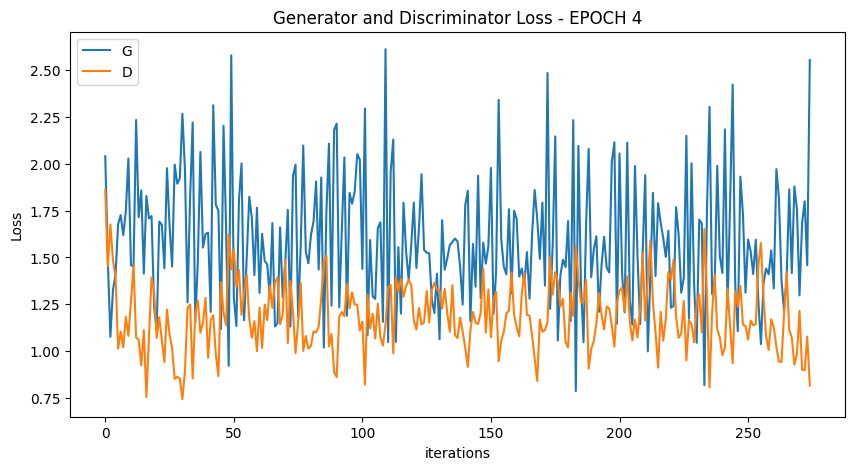

  0%|          | 0/275 [00:00<?, ?it/s]

[6/100][137/275] Loss_D: 1.0694 Loss_G: 2.3735 D(x): 0.4512 D(G(z)): 0.1750 / 0.0883
[6/100][274/275] Loss_D: 1.3307 Loss_G: 1.0474 D(x): 0.4928 D(G(z)): 0.4042 / 0.3540


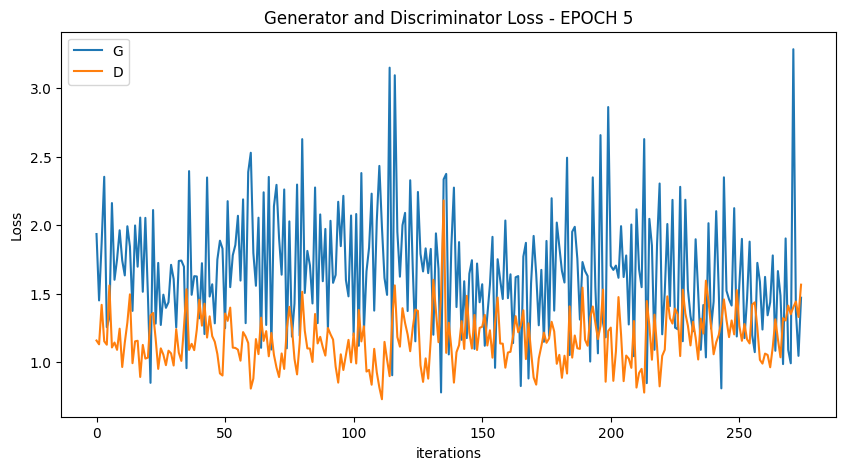

  0%|          | 0/275 [00:00<?, ?it/s]

[7/100][137/275] Loss_D: 1.0271 Loss_G: 1.6089 D(x): 0.6132 D(G(z)): 0.3439 / 0.1962
[7/100][274/275] Loss_D: 1.3272 Loss_G: 1.3391 D(x): 0.6172 D(G(z)): 0.5202 / 0.2507


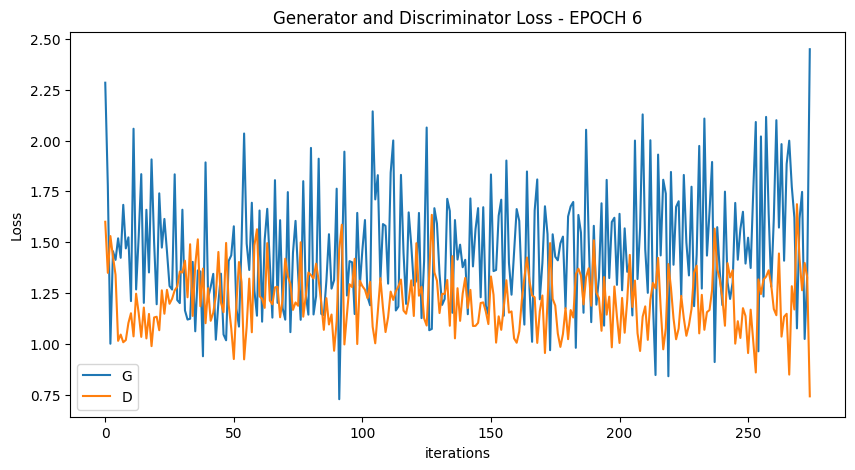

  0%|          | 0/275 [00:00<?, ?it/s]

[8/100][137/275] Loss_D: 1.0666 Loss_G: 1.6092 D(x): 0.4092 D(G(z)): 0.1090 / 0.1905
[8/100][274/275] Loss_D: 0.9761 Loss_G: 2.6568 D(x): 0.8442 D(G(z)): 0.4226 / 0.0667


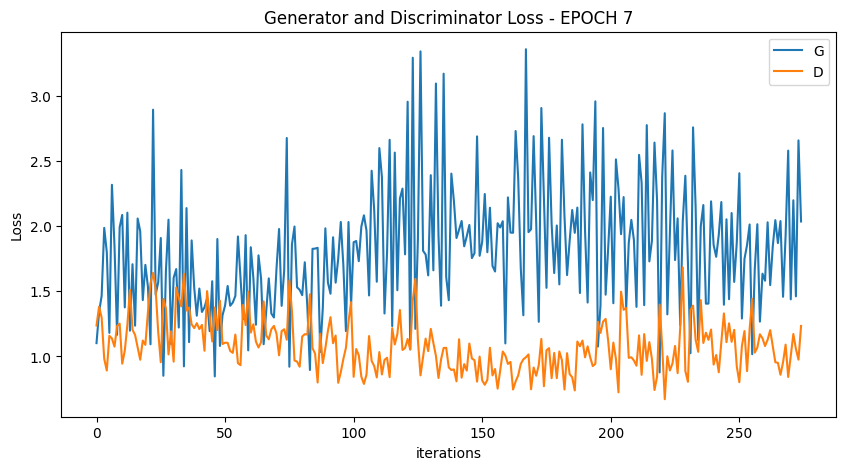

  0%|          | 0/275 [00:00<?, ?it/s]

[9/100][137/275] Loss_D: 0.8739 Loss_G: 1.5624 D(x): 0.6611 D(G(z)): 0.2536 / 0.2148
[9/100][274/275] Loss_D: 1.3877 Loss_G: 1.3949 D(x): 0.3591 D(G(z)): 0.2278 / 0.2629


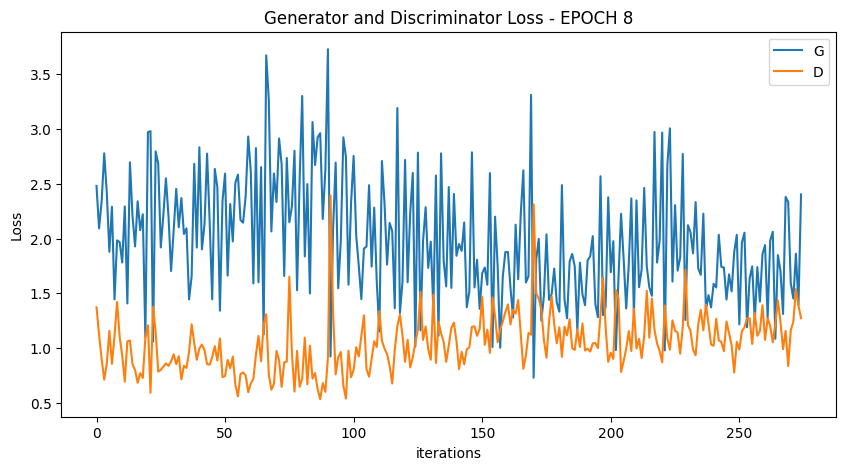

  0%|          | 0/275 [00:00<?, ?it/s]

[10/100][137/275] Loss_D: 0.8189 Loss_G: 2.0493 D(x): 0.6444 D(G(z)): 0.2278 / 0.1728
[10/100][274/275] Loss_D: 0.8880 Loss_G: 1.7741 D(x): 0.4690 D(G(z)): 0.0801 / 0.1811


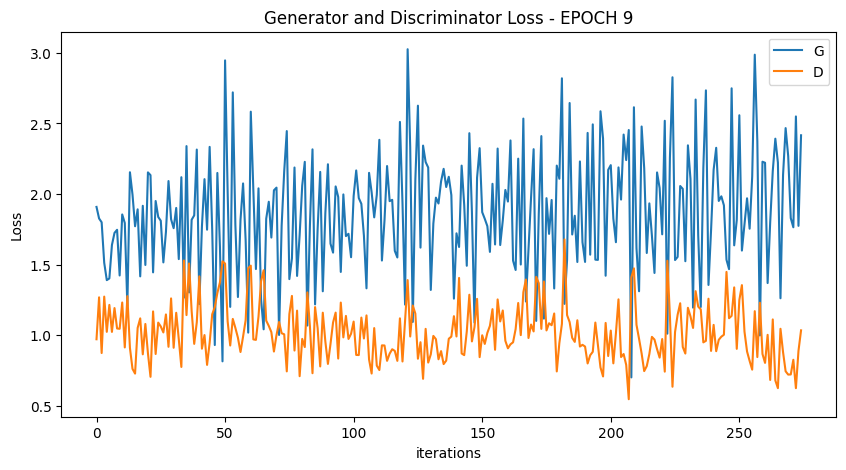

  0%|          | 0/275 [00:00<?, ?it/s]

[11/100][137/275] Loss_D: 0.7545 Loss_G: 1.9399 D(x): 0.6381 D(G(z)): 0.1281 / 0.1564
[11/100][274/275] Loss_D: 0.6230 Loss_G: 2.4986 D(x): 0.7879 D(G(z)): 0.1893 / 0.0927


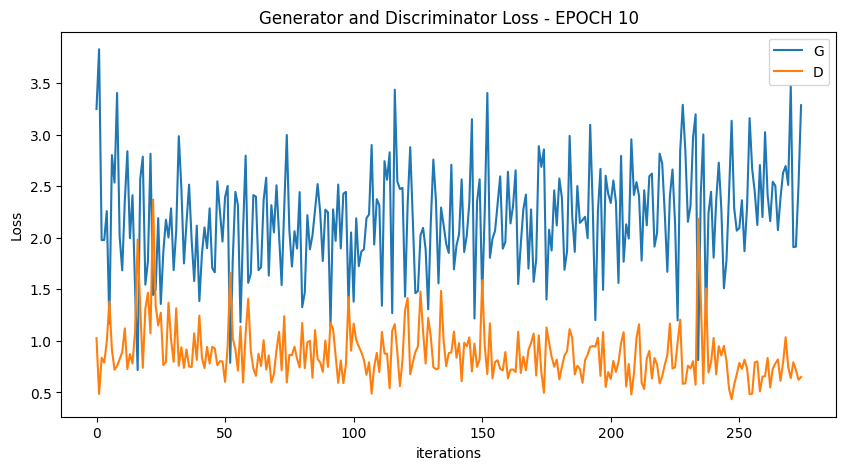

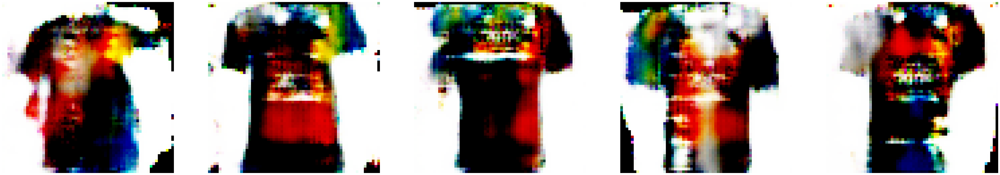

  0%|          | 0/275 [00:00<?, ?it/s]

[12/100][137/275] Loss_D: 0.9312 Loss_G: 1.7981 D(x): 0.5886 D(G(z)): 0.2436 / 0.1734
[12/100][274/275] Loss_D: 0.5135 Loss_G: 4.6081 D(x): 0.6607 D(G(z)): 0.0091 / 0.0096


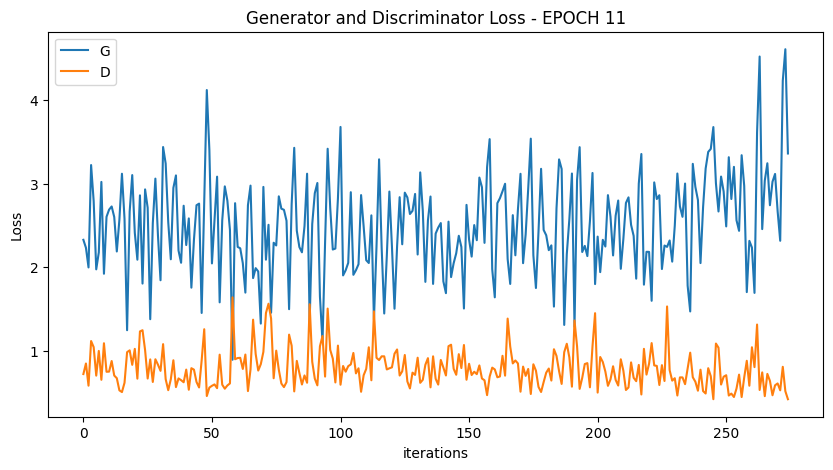

  0%|          | 0/275 [00:00<?, ?it/s]

[13/100][137/275] Loss_D: 0.8891 Loss_G: 3.0268 D(x): 0.7539 D(G(z)): 0.3385 / 0.0505
[13/100][274/275] Loss_D: 0.8563 Loss_G: 2.7347 D(x): 0.9191 D(G(z)): 0.3723 / 0.0570


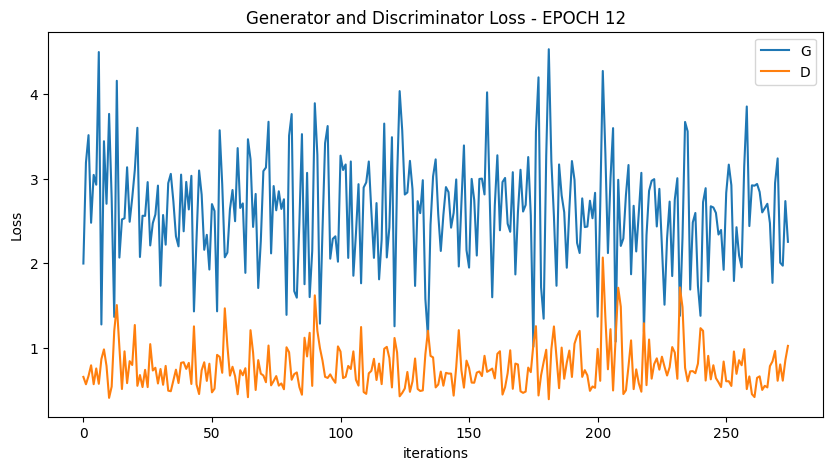

  0%|          | 0/275 [00:00<?, ?it/s]

[14/100][137/275] Loss_D: 0.8719 Loss_G: 2.3278 D(x): 0.4735 D(G(z)): 0.0368 / 0.1177
[14/100][274/275] Loss_D: 0.5180 Loss_G: 2.5707 D(x): 0.8497 D(G(z)): 0.1374 / 0.0814


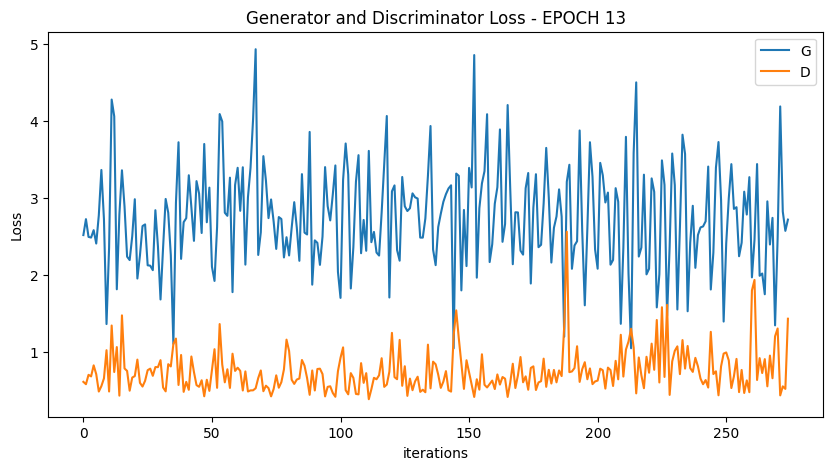

  0%|          | 0/275 [00:00<?, ?it/s]

[15/100][137/275] Loss_D: 1.1584 Loss_G: 3.4816 D(x): 0.9615 D(G(z)): 0.5052 / 0.0348
[15/100][274/275] Loss_D: 0.6437 Loss_G: 2.9727 D(x): 0.6124 D(G(z)): 0.0515 / 0.0493


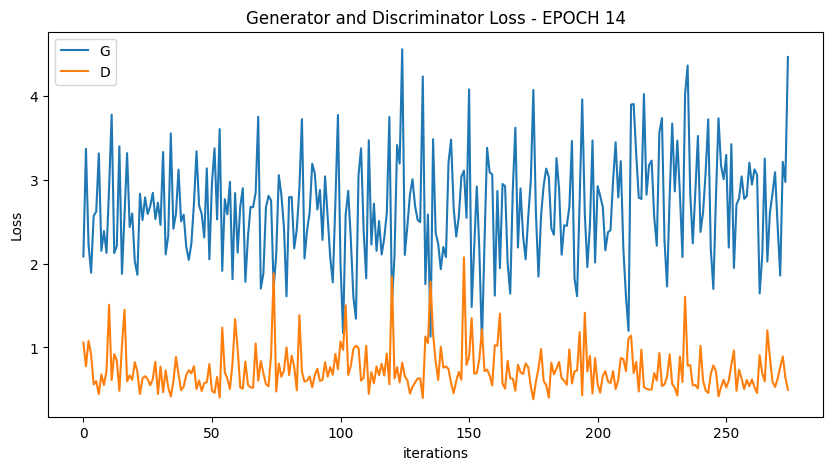

  0%|          | 0/275 [00:00<?, ?it/s]

[16/100][137/275] Loss_D: 0.9299 Loss_G: 2.6154 D(x): 0.9687 D(G(z)): 0.3775 / 0.0725
[16/100][274/275] Loss_D: 0.5086 Loss_G: 3.2346 D(x): 0.8624 D(G(z)): 0.1418 / 0.0423


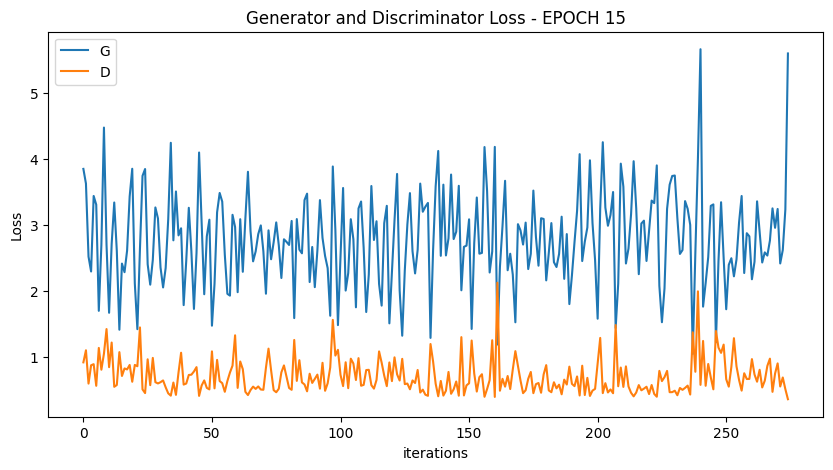

  0%|          | 0/275 [00:00<?, ?it/s]

[17/100][137/275] Loss_D: 0.7050 Loss_G: 2.6608 D(x): 0.9336 D(G(z)): 0.2674 / 0.0626
[17/100][274/275] Loss_D: 0.4479 Loss_G: 3.0047 D(x): 0.7615 D(G(z)): 0.0354 / 0.0526


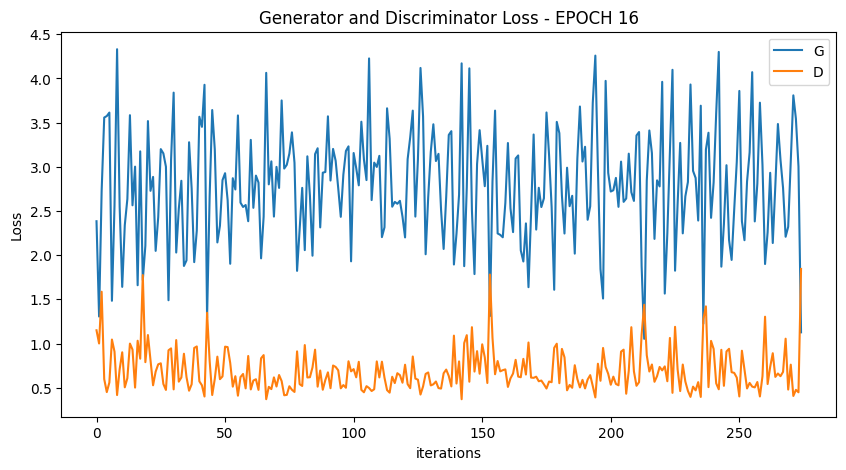

  0%|          | 0/275 [00:00<?, ?it/s]

[18/100][137/275] Loss_D: 0.7373 Loss_G: 2.0779 D(x): 0.6115 D(G(z)): 0.1257 / 0.1332
[18/100][274/275] Loss_D: 0.5594 Loss_G: 2.4600 D(x): 0.6734 D(G(z)): 0.0523 / 0.0943


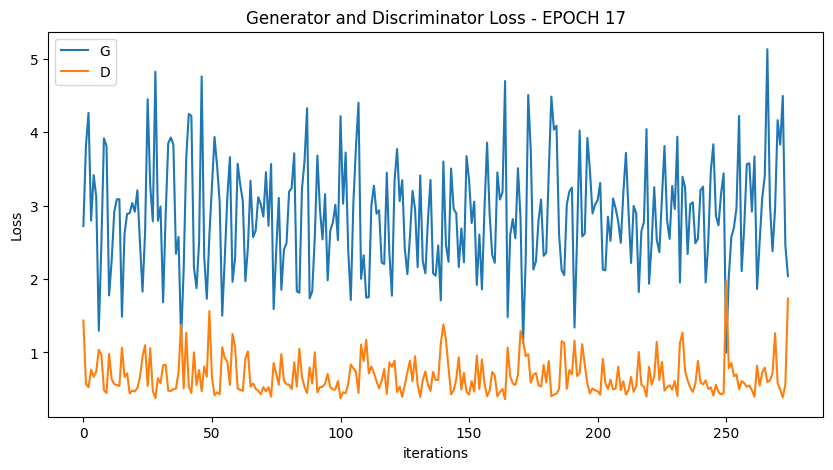

  0%|          | 0/275 [00:00<?, ?it/s]

[19/100][137/275] Loss_D: 0.7087 Loss_G: 3.3359 D(x): 0.9192 D(G(z)): 0.2752 / 0.0329
[19/100][274/275] Loss_D: 0.4639 Loss_G: 3.1687 D(x): 0.7940 D(G(z)): 0.0389 / 0.0516


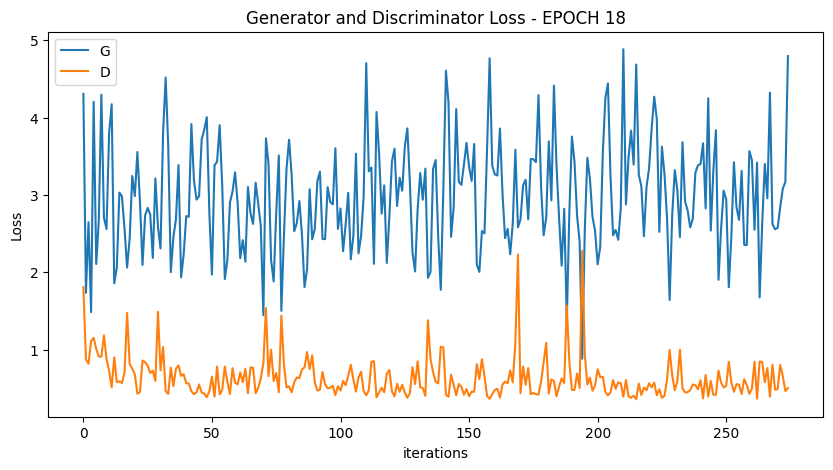

  0%|          | 0/275 [00:00<?, ?it/s]

[20/100][137/275] Loss_D: 0.5730 Loss_G: 2.8248 D(x): 0.6609 D(G(z)): 0.0621 / 0.0726
[20/100][274/275] Loss_D: 0.8477 Loss_G: 2.4359 D(x): 0.9642 D(G(z)): 0.3195 / 0.0897


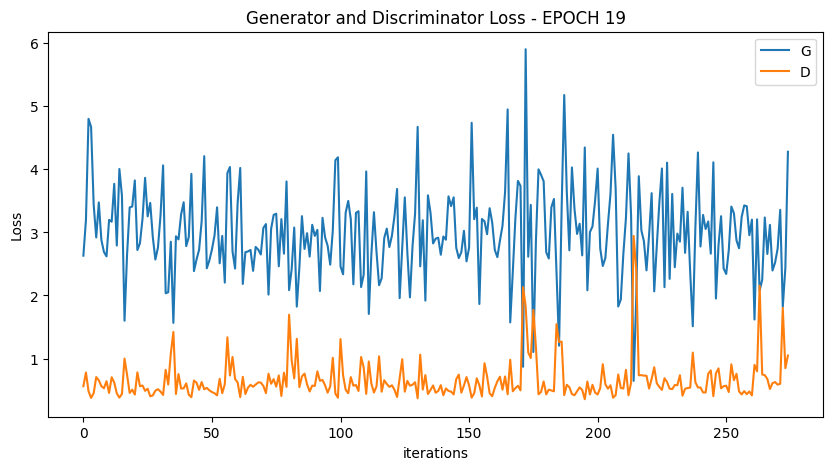

  0%|          | 0/275 [00:00<?, ?it/s]

[21/100][137/275] Loss_D: 0.6693 Loss_G: 2.9977 D(x): 0.9649 D(G(z)): 0.2262 / 0.0413
[21/100][274/275] Loss_D: 0.5546 Loss_G: 3.6116 D(x): 0.6432 D(G(z)): 0.0091 / 0.0260


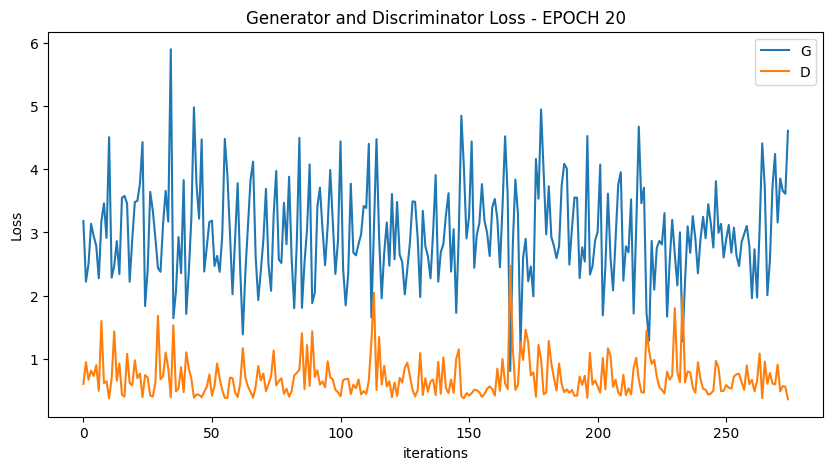

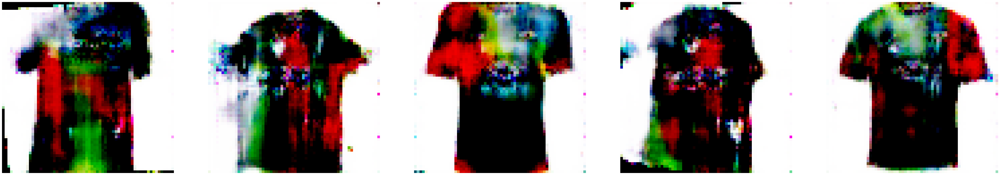

  0%|          | 0/275 [00:00<?, ?it/s]

[22/100][137/275] Loss_D: 0.9574 Loss_G: 2.5505 D(x): 0.6194 D(G(z)): 0.3063 / 0.0760
[22/100][274/275] Loss_D: 0.7804 Loss_G: 2.9441 D(x): 0.9301 D(G(z)): 0.3178 / 0.0504


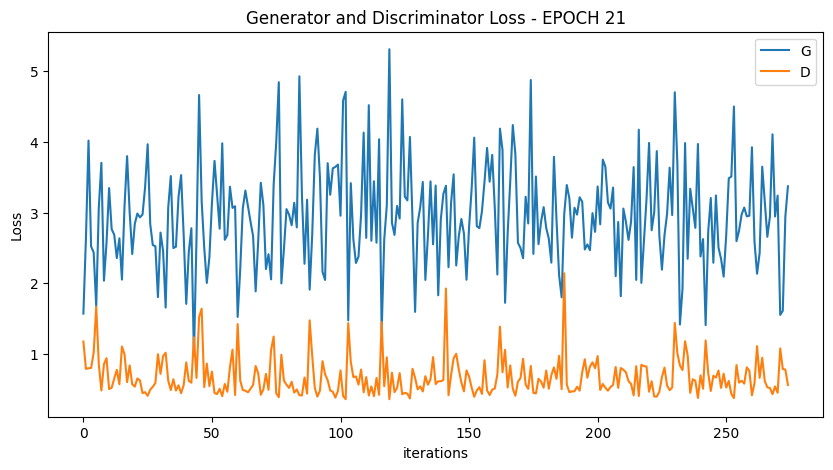

  0%|          | 0/275 [00:00<?, ?it/s]

[23/100][137/275] Loss_D: 0.6272 Loss_G: 2.8949 D(x): 0.6507 D(G(z)): 0.0344 / 0.0592
[23/100][274/275] Loss_D: 0.9755 Loss_G: 2.1526 D(x): 0.6648 D(G(z)): 0.3331 / 0.1262


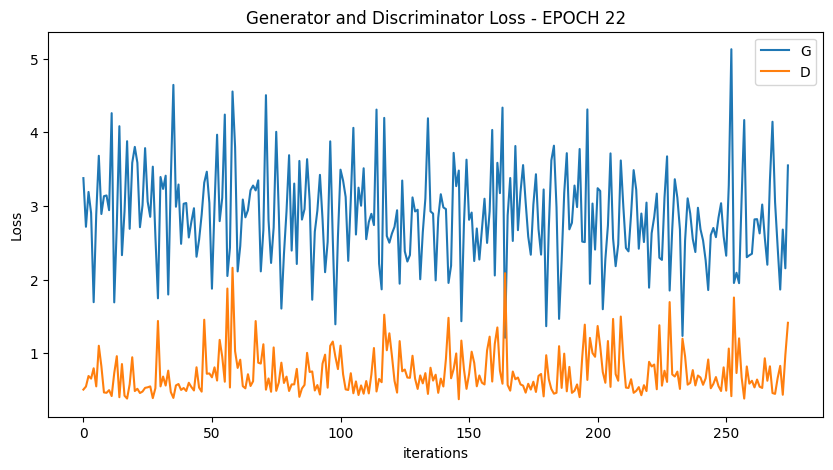

  0%|          | 0/275 [00:00<?, ?it/s]

[24/100][137/275] Loss_D: 0.7807 Loss_G: 2.6362 D(x): 0.5121 D(G(z)): 0.0238 / 0.0610
[24/100][274/275] Loss_D: 0.8795 Loss_G: 2.1589 D(x): 0.7539 D(G(z)): 0.3157 / 0.1160


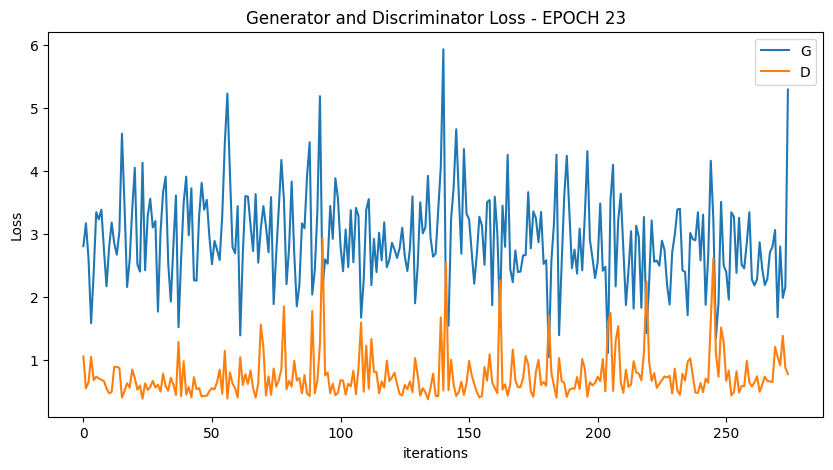

  0%|          | 0/275 [00:00<?, ?it/s]

[25/100][137/275] Loss_D: 0.8403 Loss_G: 4.1119 D(x): 0.9305 D(G(z)): 0.3379 / 0.0152
[25/100][274/275] Loss_D: 0.4988 Loss_G: 2.4927 D(x): 0.7717 D(G(z)): 0.0767 / 0.0757


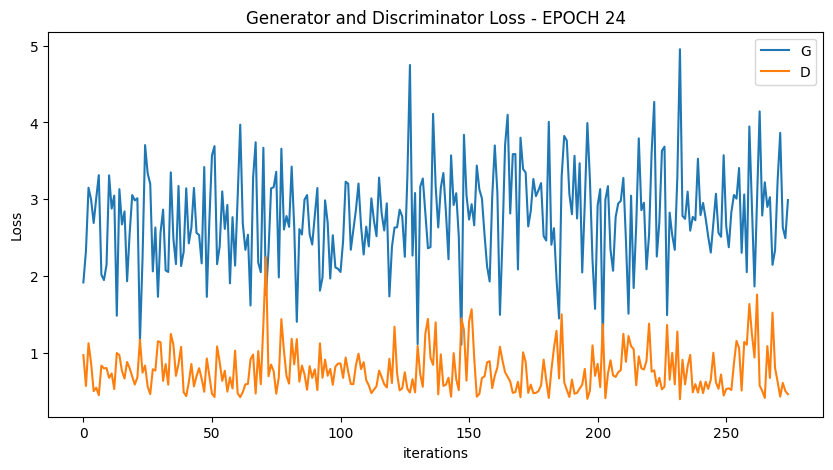

  0%|          | 0/275 [00:00<?, ?it/s]

[26/100][137/275] Loss_D: 0.5948 Loss_G: 3.0677 D(x): 0.7550 D(G(z)): 0.1499 / 0.0447
[26/100][274/275] Loss_D: 0.4560 Loss_G: 3.2255 D(x): 0.7988 D(G(z)): 0.0474 / 0.0484


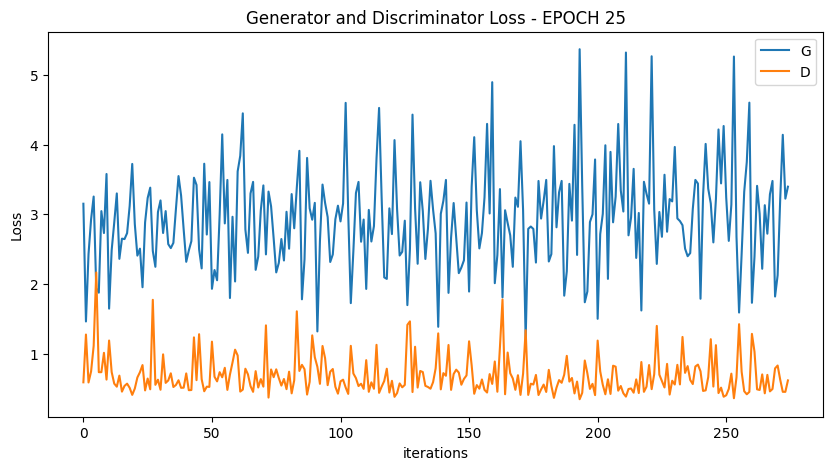

  0%|          | 0/275 [00:00<?, ?it/s]

[27/100][137/275] Loss_D: 1.2810 Loss_G: 4.2834 D(x): 0.9605 D(G(z)): 0.5405 / 0.0188
[27/100][274/275] Loss_D: 0.7003 Loss_G: 2.9642 D(x): 0.8842 D(G(z)): 0.2450 / 0.0507


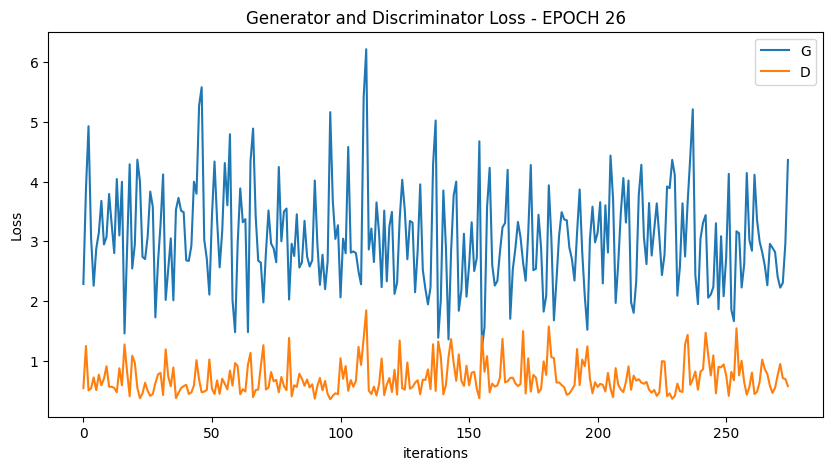

  0%|          | 0/275 [00:00<?, ?it/s]

[28/100][137/275] Loss_D: 0.4710 Loss_G: 3.3330 D(x): 0.7664 D(G(z)): 0.0496 / 0.0350
[28/100][274/275] Loss_D: 0.9254 Loss_G: 3.3030 D(x): 0.9941 D(G(z)): 0.3027 / 0.0325


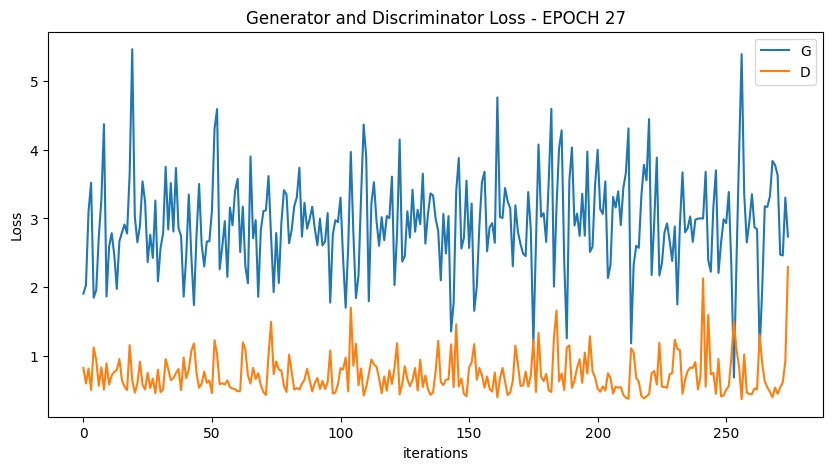

  0%|          | 0/275 [00:00<?, ?it/s]

[29/100][137/275] Loss_D: 0.8900 Loss_G: 2.1104 D(x): 0.6541 D(G(z)): 0.2758 / 0.1251
[29/100][274/275] Loss_D: 0.9237 Loss_G: 2.1343 D(x): 0.8702 D(G(z)): 0.3799 / 0.1279


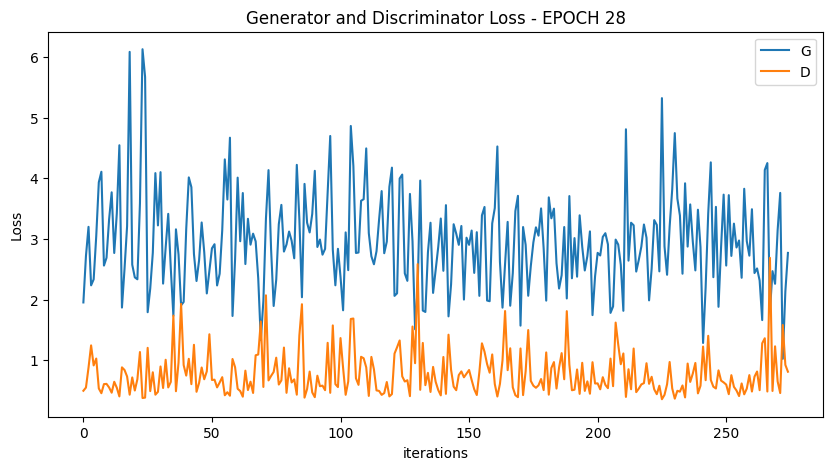

  0%|          | 0/275 [00:00<?, ?it/s]

[30/100][137/275] Loss_D: 0.5365 Loss_G: 2.9040 D(x): 0.7763 D(G(z)): 0.1040 / 0.0714
[30/100][274/275] Loss_D: 0.7684 Loss_G: 3.1325 D(x): 0.7209 D(G(z)): 0.2515 / 0.0463


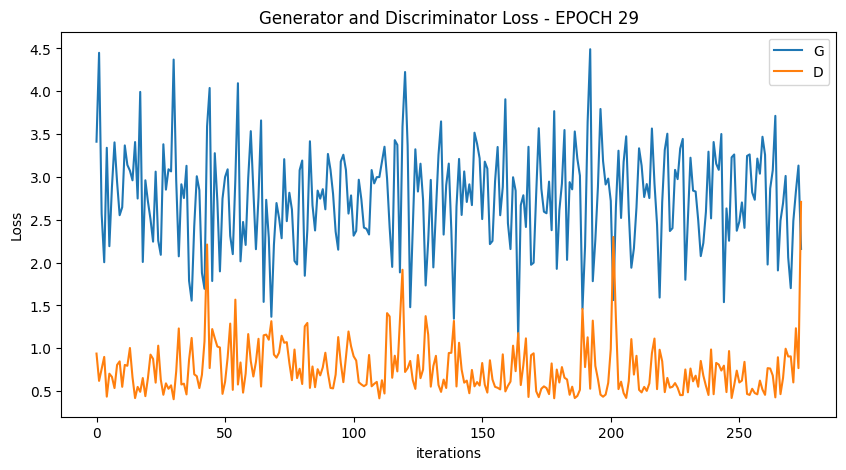

  0%|          | 0/275 [00:00<?, ?it/s]

[31/100][137/275] Loss_D: 0.4936 Loss_G: 2.6186 D(x): 0.8430 D(G(z)): 0.1206 / 0.0856
[31/100][274/275] Loss_D: 0.6213 Loss_G: 2.7492 D(x): 0.6030 D(G(z)): 0.0311 / 0.0813


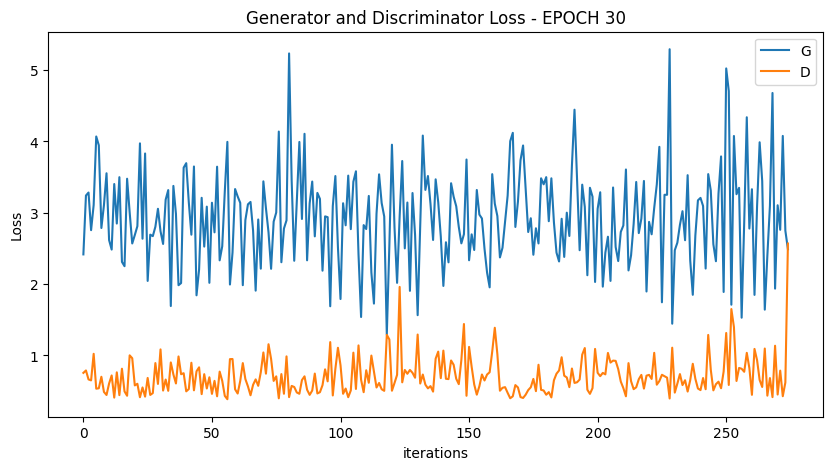

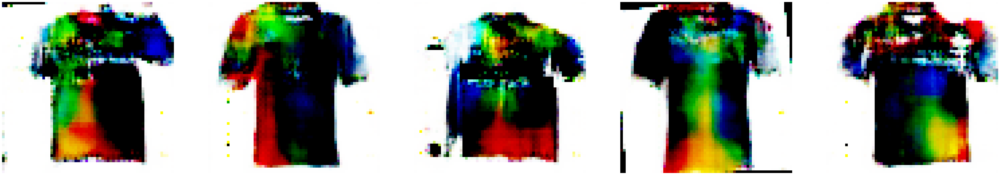

  0%|          | 0/275 [00:00<?, ?it/s]

[32/100][137/275] Loss_D: 0.4486 Loss_G: 3.5189 D(x): 0.8295 D(G(z)): 0.0509 / 0.0336
[32/100][274/275] Loss_D: 0.3979 Loss_G: 3.3472 D(x): 0.9437 D(G(z)): 0.0375 / 0.0310


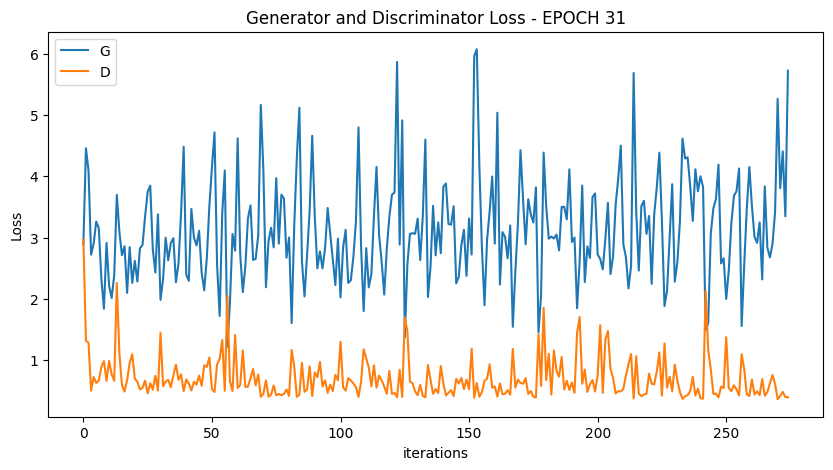

  0%|          | 0/275 [00:00<?, ?it/s]

[33/100][137/275] Loss_D: 0.4469 Loss_G: 3.6333 D(x): 0.7832 D(G(z)): 0.0347 / 0.0296
[33/100][274/275] Loss_D: 0.5602 Loss_G: 2.8414 D(x): 0.9094 D(G(z)): 0.1655 / 0.0573


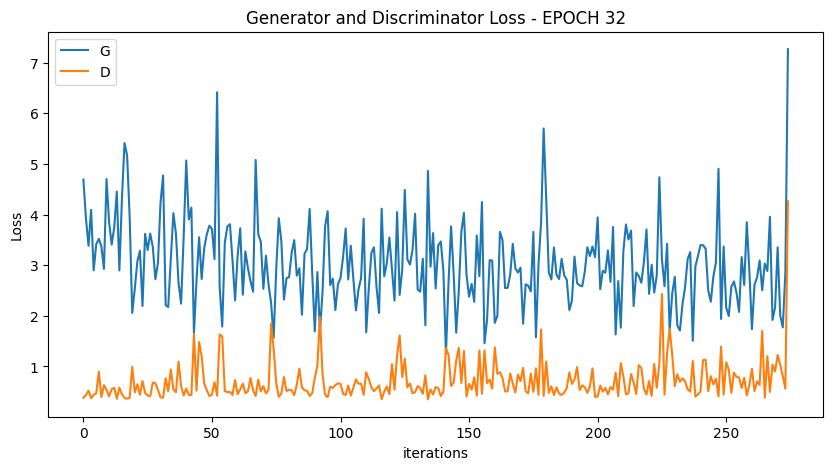

  0%|          | 0/275 [00:00<?, ?it/s]

[34/100][137/275] Loss_D: 0.4610 Loss_G: 2.9223 D(x): 0.8001 D(G(z)): 0.0555 / 0.0639
[34/100][274/275] Loss_D: 0.7189 Loss_G: 2.5161 D(x): 0.5621 D(G(z)): 0.0633 / 0.0769


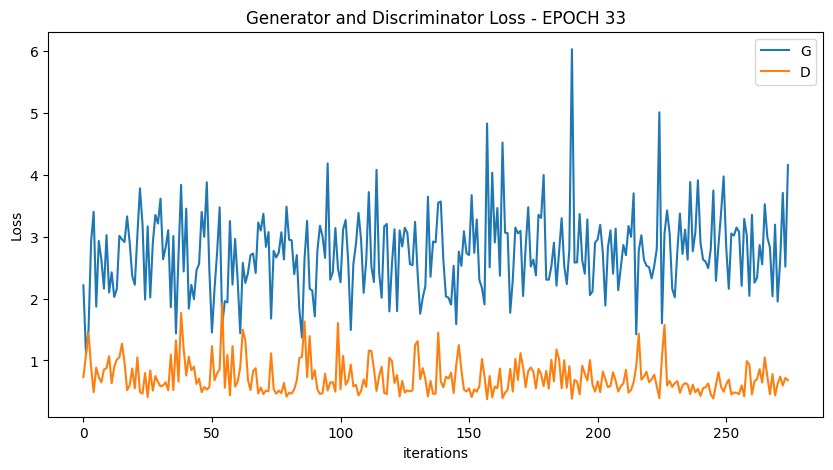

  0%|          | 0/275 [00:00<?, ?it/s]

[35/100][137/275] Loss_D: 0.5857 Loss_G: 2.1007 D(x): 0.6889 D(G(z)): 0.0900 / 0.1222
[35/100][274/275] Loss_D: 1.0865 Loss_G: 2.1780 D(x): 0.4298 D(G(z)): 0.0590 / 0.1256


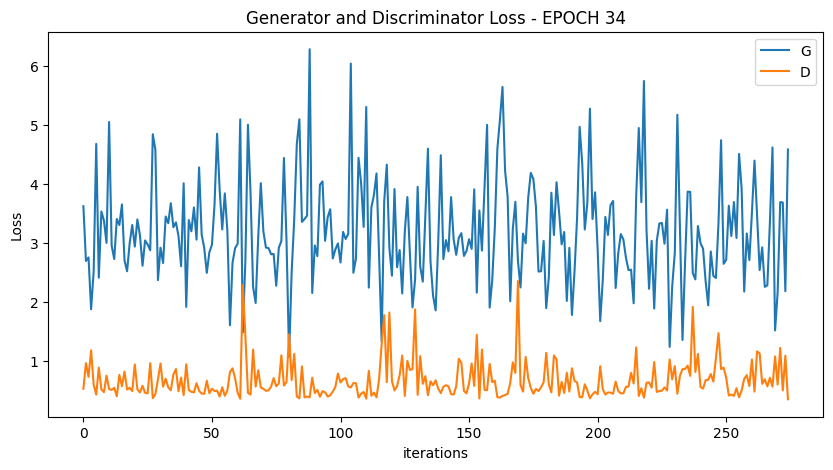

  0%|          | 0/275 [00:00<?, ?it/s]

[36/100][137/275] Loss_D: 0.4795 Loss_G: 3.9149 D(x): 0.7436 D(G(z)): 0.0312 / 0.0217
[36/100][274/275] Loss_D: 0.5708 Loss_G: 3.7908 D(x): 0.9770 D(G(z)): 0.1270 / 0.0235


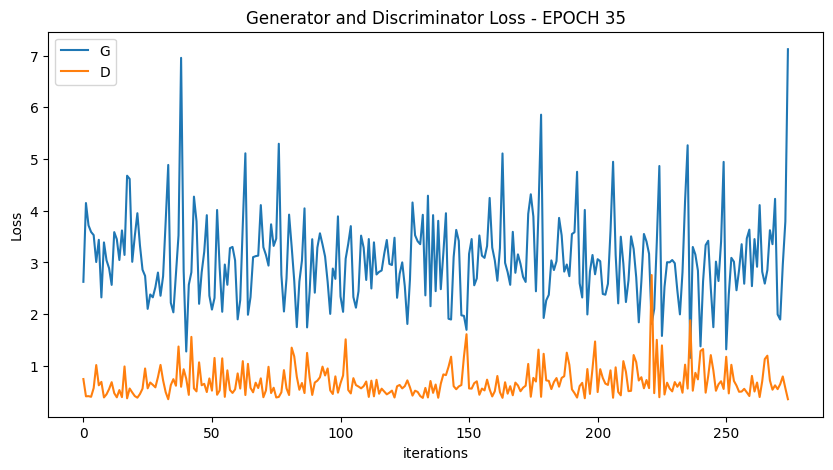

  0%|          | 0/275 [00:00<?, ?it/s]

[37/100][137/275] Loss_D: 0.4711 Loss_G: 3.1827 D(x): 0.8938 D(G(z)): 0.0990 / 0.0393
[37/100][274/275] Loss_D: 1.0814 Loss_G: 3.6089 D(x): 0.3870 D(G(z)): 0.0107 / 0.0249


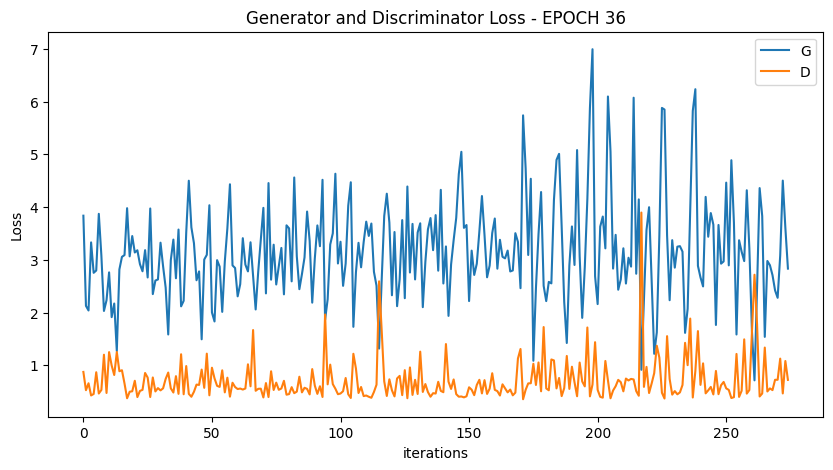

  0%|          | 0/275 [00:00<?, ?it/s]

[38/100][137/275] Loss_D: 0.5635 Loss_G: 2.7229 D(x): 0.7331 D(G(z)): 0.1141 / 0.0707
[38/100][274/275] Loss_D: 1.2918 Loss_G: 3.0248 D(x): 0.8405 D(G(z)): 0.5419 / 0.0431


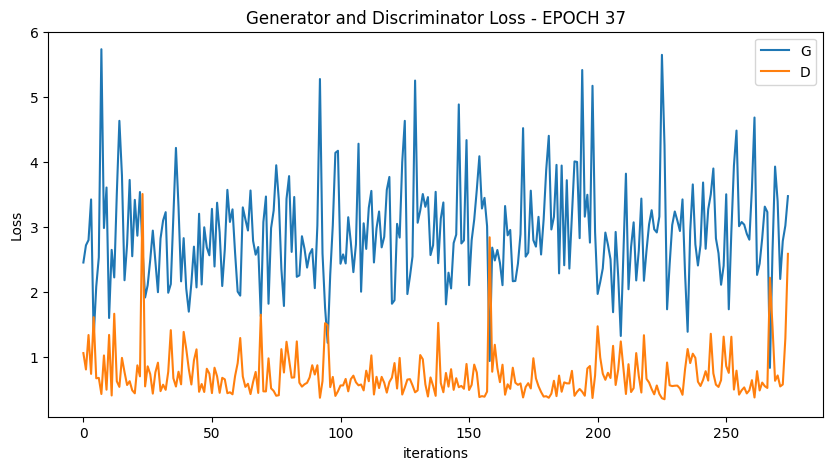

  0%|          | 0/275 [00:00<?, ?it/s]

[39/100][137/275] Loss_D: 1.3741 Loss_G: 1.7586 D(x): 0.3170 D(G(z)): 0.1089 / 0.2067
[39/100][274/275] Loss_D: 0.6756 Loss_G: 2.6775 D(x): 0.5947 D(G(z)): 0.0243 / 0.1041


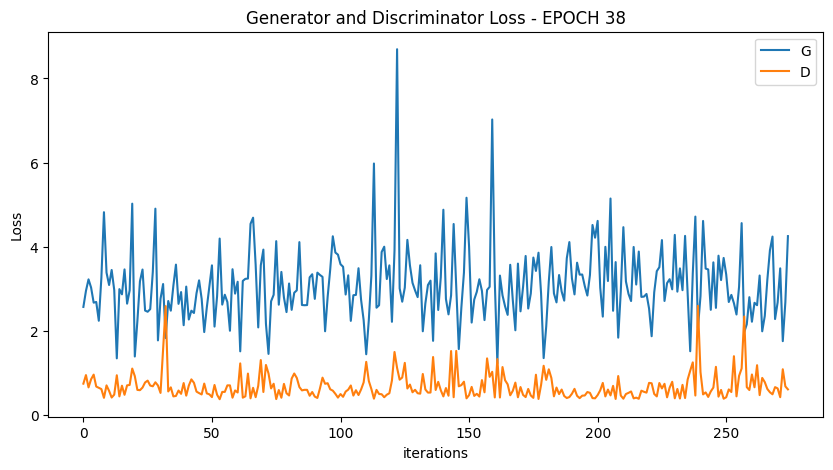

  0%|          | 0/275 [00:00<?, ?it/s]

[40/100][137/275] Loss_D: 0.6833 Loss_G: 3.4880 D(x): 0.8246 D(G(z)): 0.2425 / 0.0309
[40/100][274/275] Loss_D: 0.6076 Loss_G: 3.3247 D(x): 0.7025 D(G(z)): 0.0277 / 0.0354


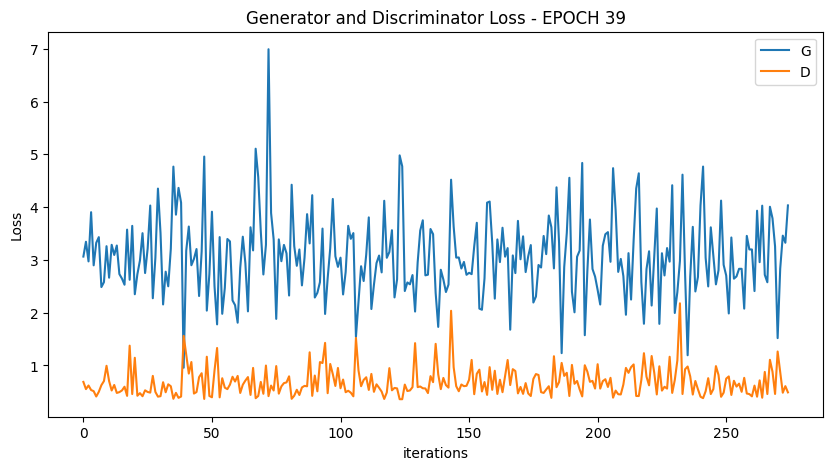

  0%|          | 0/275 [00:00<?, ?it/s]

[41/100][137/275] Loss_D: 0.4619 Loss_G: 3.8098 D(x): 0.7406 D(G(z)): 0.0134 / 0.0244
[41/100][274/275] Loss_D: 0.5314 Loss_G: 3.9177 D(x): 0.7754 D(G(z)): 0.0194 / 0.0211


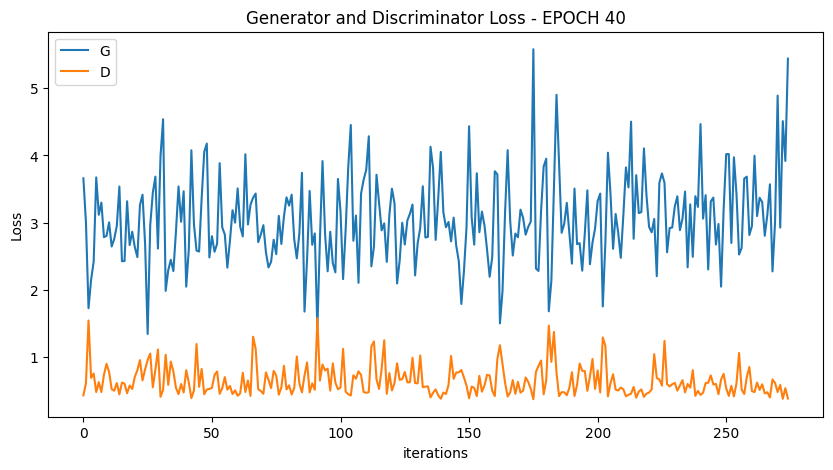

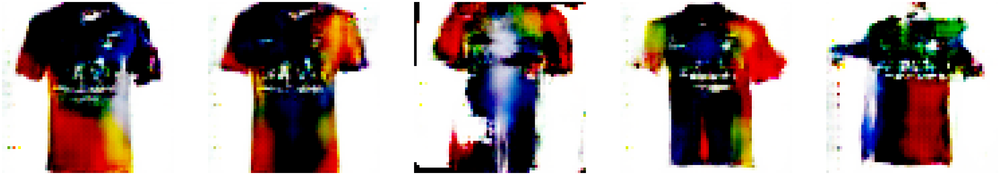

  0%|          | 0/275 [00:00<?, ?it/s]

[42/100][137/275] Loss_D: 1.1776 Loss_G: 1.2991 D(x): 0.3495 D(G(z)): 0.0571 / 0.3068
[42/100][274/275] Loss_D: 0.6495 Loss_G: 2.7718 D(x): 0.9922 D(G(z)): 0.1108 / 0.0583


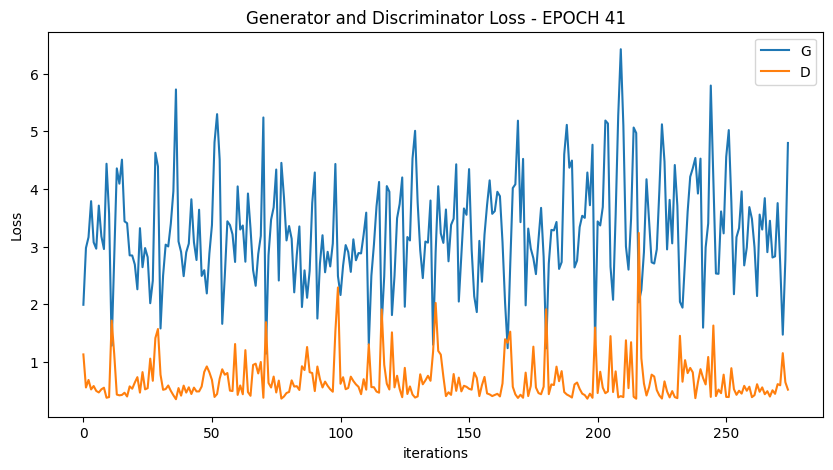

  0%|          | 0/275 [00:00<?, ?it/s]

[43/100][137/275] Loss_D: 1.9195 Loss_G: 2.2348 D(x): 0.4777 D(G(z)): 0.6246 / 0.1255
[43/100][274/275] Loss_D: 0.5026 Loss_G: 2.9156 D(x): 0.9012 D(G(z)): 0.1225 / 0.0470


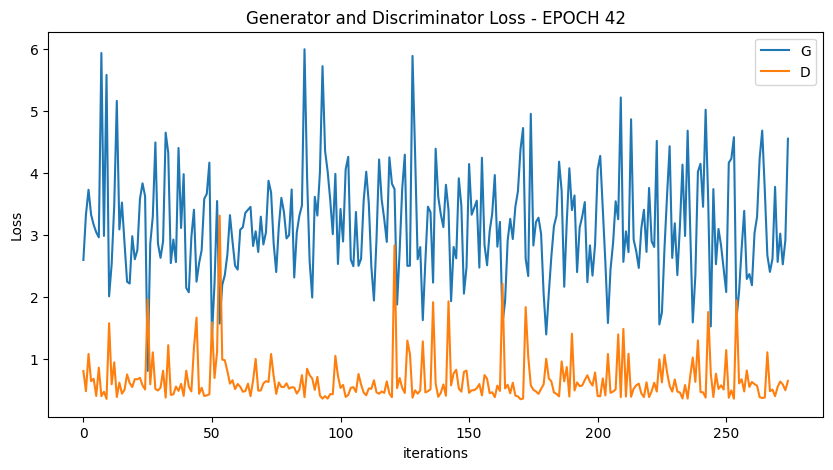

  0%|          | 0/275 [00:00<?, ?it/s]

[44/100][137/275] Loss_D: 1.1384 Loss_G: 3.0034 D(x): 0.9677 D(G(z)): 0.4823 / 0.0424
[44/100][274/275] Loss_D: 0.9715 Loss_G: 3.0844 D(x): 0.9817 D(G(z)): 0.3200 / 0.0424


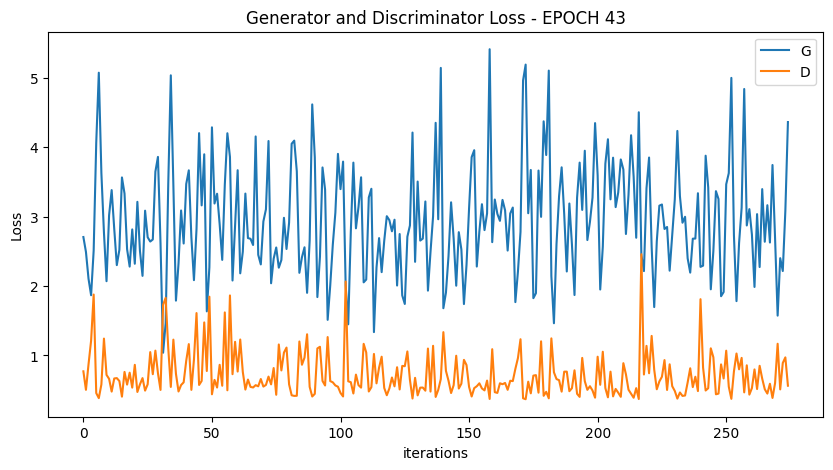

  0%|          | 0/275 [00:00<?, ?it/s]

[45/100][137/275] Loss_D: 0.5312 Loss_G: 2.9582 D(x): 0.9333 D(G(z)): 0.1460 / 0.0425
[45/100][274/275] Loss_D: 0.4240 Loss_G: 2.8502 D(x): 0.9190 D(G(z)): 0.0607 / 0.0612


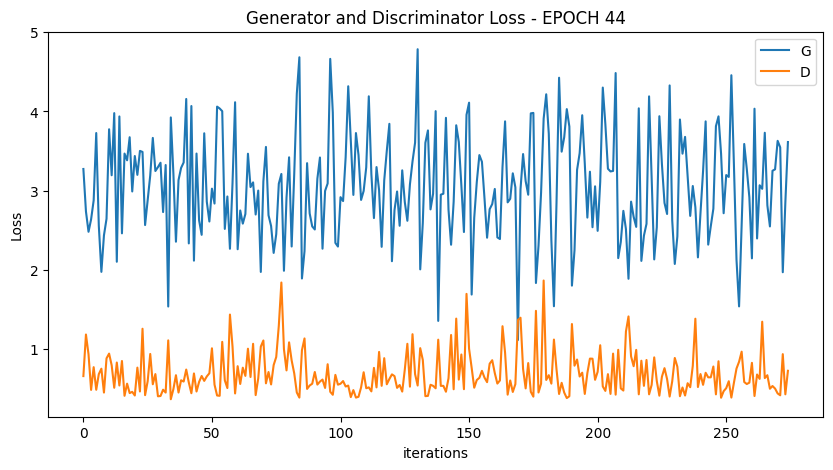

  0%|          | 0/275 [00:00<?, ?it/s]

[46/100][137/275] Loss_D: 0.4795 Loss_G: 4.0236 D(x): 0.7317 D(G(z)): 0.0211 / 0.0159
[46/100][274/275] Loss_D: 0.5028 Loss_G: 3.0342 D(x): 0.8214 D(G(z)): 0.0757 / 0.0510


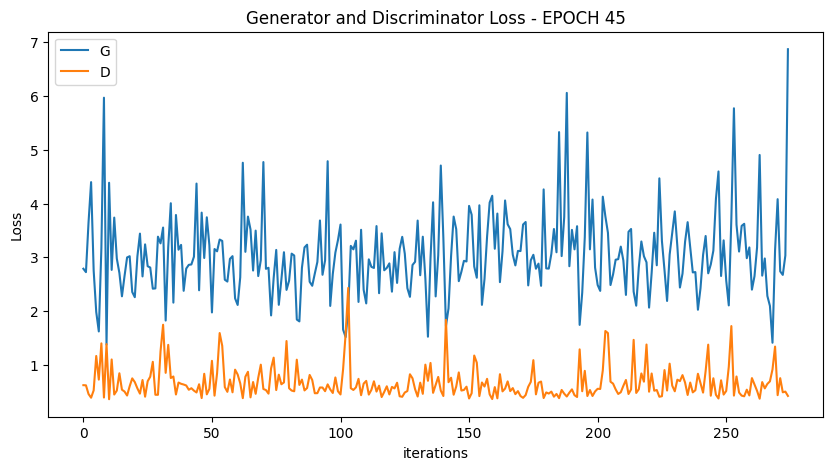

  0%|          | 0/275 [00:00<?, ?it/s]

[47/100][137/275] Loss_D: 0.9987 Loss_G: 2.3155 D(x): 0.4315 D(G(z)): 0.0511 / 0.0996
[47/100][274/275] Loss_D: 0.6264 Loss_G: 2.3305 D(x): 0.6501 D(G(z)): 0.0827 / 0.1118


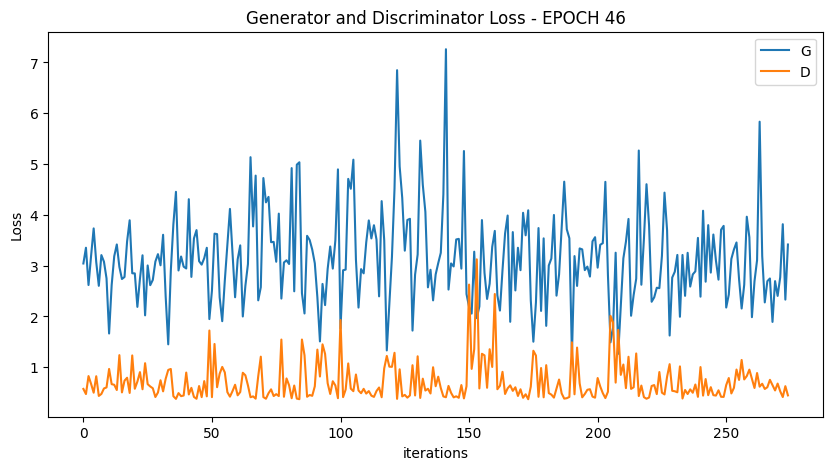

  0%|          | 0/275 [00:00<?, ?it/s]

[48/100][137/275] Loss_D: 1.1401 Loss_G: 3.5934 D(x): 0.9915 D(G(z)): 0.4320 / 0.0234
[48/100][274/275] Loss_D: 0.6614 Loss_G: 4.0871 D(x): 0.5645 D(G(z)): 0.0067 / 0.0138


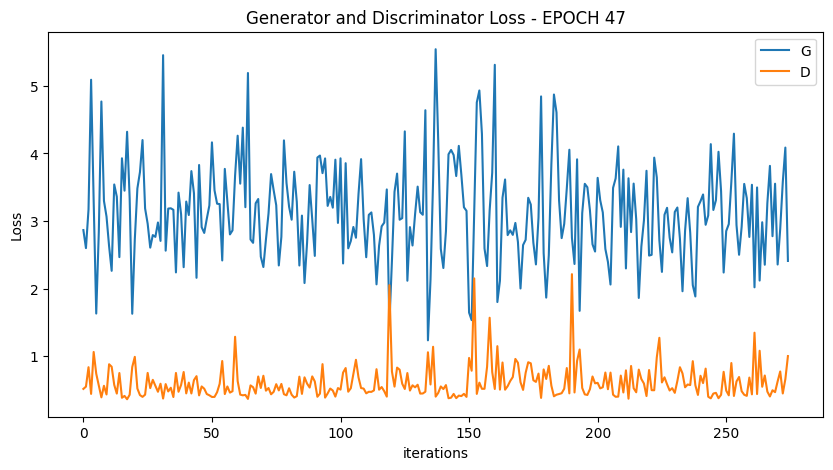

  0%|          | 0/275 [00:00<?, ?it/s]

[49/100][137/275] Loss_D: 0.9492 Loss_G: 2.9773 D(x): 0.4812 D(G(z)): 0.0456 / 0.0608
[49/100][274/275] Loss_D: 0.7844 Loss_G: 3.2057 D(x): 0.8726 D(G(z)): 0.3097 / 0.0376


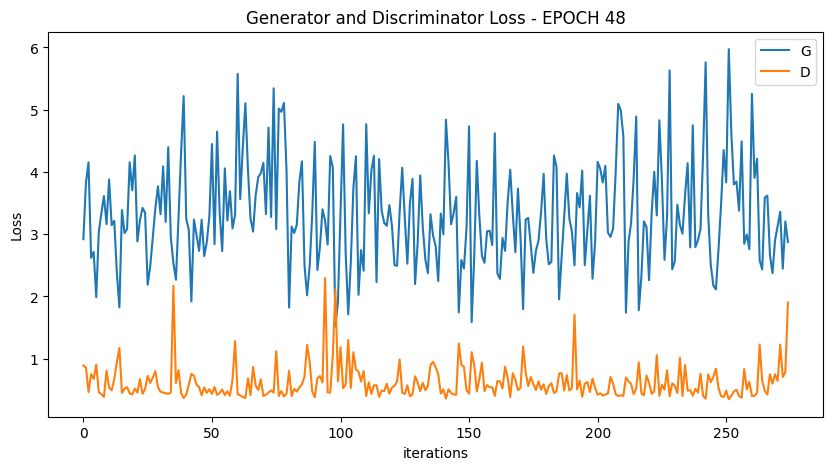

  0%|          | 0/275 [00:00<?, ?it/s]

[50/100][137/275] Loss_D: 0.7047 Loss_G: 2.9368 D(x): 0.5813 D(G(z)): 0.0434 / 0.0640
[50/100][274/275] Loss_D: 0.6326 Loss_G: 4.0006 D(x): 0.6152 D(G(z)): 0.0155 / 0.0237


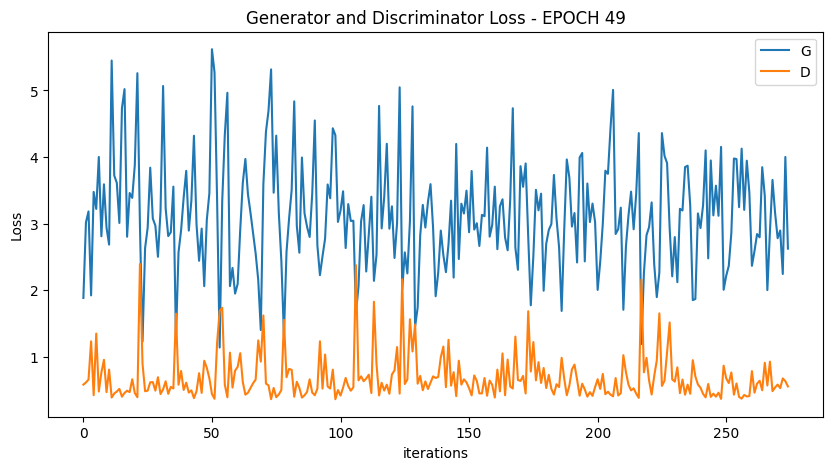

  0%|          | 0/275 [00:00<?, ?it/s]

[51/100][137/275] Loss_D: 0.3842 Loss_G: 4.3589 D(x): 0.8367 D(G(z)): 0.0144 / 0.0103
[51/100][274/275] Loss_D: 0.5078 Loss_G: 4.1599 D(x): 0.9887 D(G(z)): 0.0271 / 0.0131


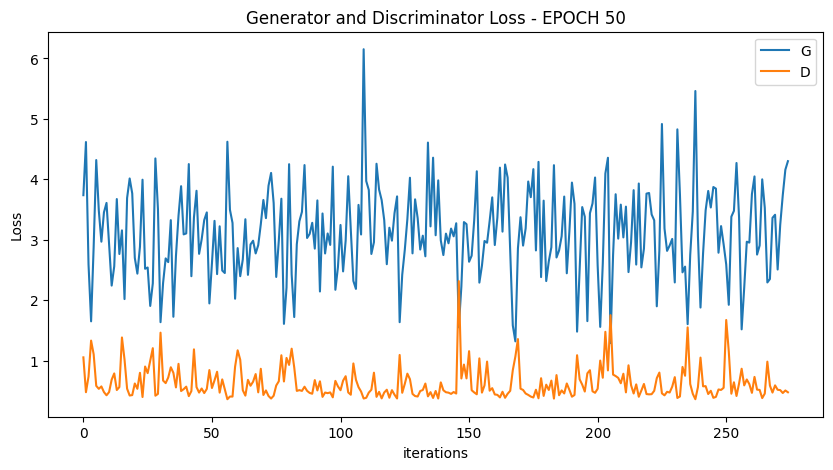

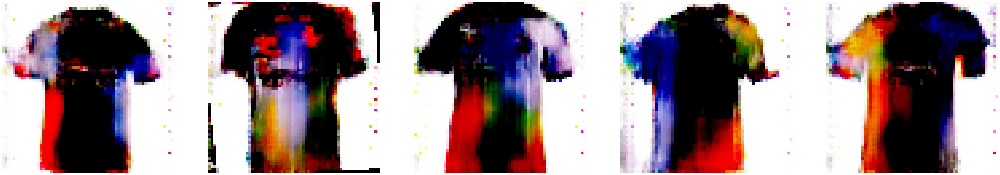

  0%|          | 0/275 [00:00<?, ?it/s]

[52/100][137/275] Loss_D: 0.4480 Loss_G: 3.6705 D(x): 0.7777 D(G(z)): 0.0334 / 0.0248
[52/100][274/275] Loss_D: 0.6064 Loss_G: 2.6209 D(x): 0.9846 D(G(z)): 0.1276 / 0.0707


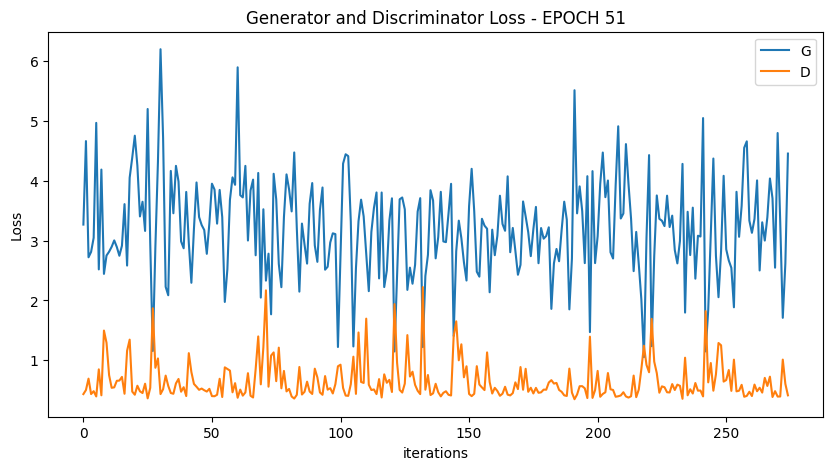

  0%|          | 0/275 [00:00<?, ?it/s]

[53/100][137/275] Loss_D: 1.1446 Loss_G: 3.2185 D(x): 0.3792 D(G(z)): 0.0091 / 0.0514
[53/100][274/275] Loss_D: 0.5816 Loss_G: 2.4775 D(x): 0.7815 D(G(z)): 0.1518 / 0.0821


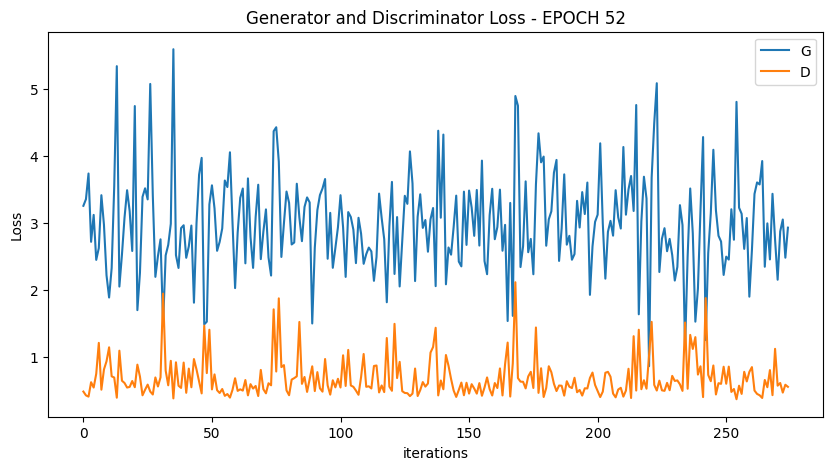

  0%|          | 0/275 [00:00<?, ?it/s]

[54/100][137/275] Loss_D: 1.3287 Loss_G: 2.3668 D(x): 0.3120 D(G(z)): 0.0320 / 0.1086
[54/100][274/275] Loss_D: 0.7049 Loss_G: 2.0145 D(x): 0.5764 D(G(z)): 0.0634 / 0.1310


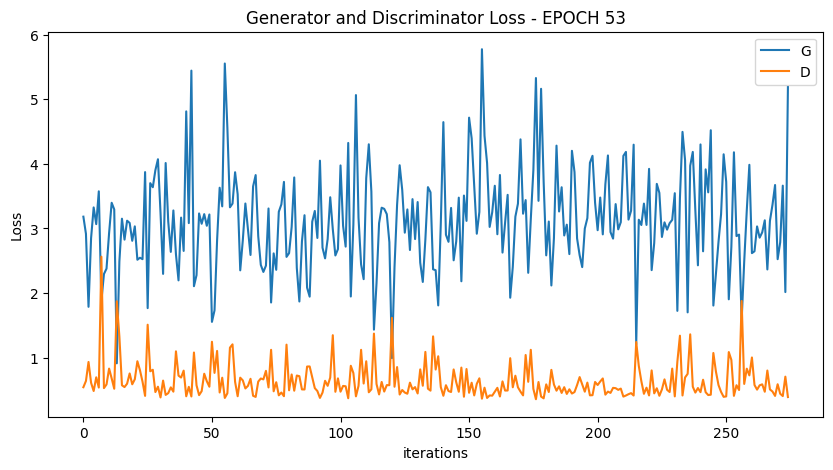

  0%|          | 0/275 [00:00<?, ?it/s]

[55/100][137/275] Loss_D: 0.6152 Loss_G: 2.4803 D(x): 0.6459 D(G(z)): 0.0465 / 0.1014
[55/100][274/275] Loss_D: 0.4132 Loss_G: 3.9613 D(x): 0.8520 D(G(z)): 0.0384 / 0.0194


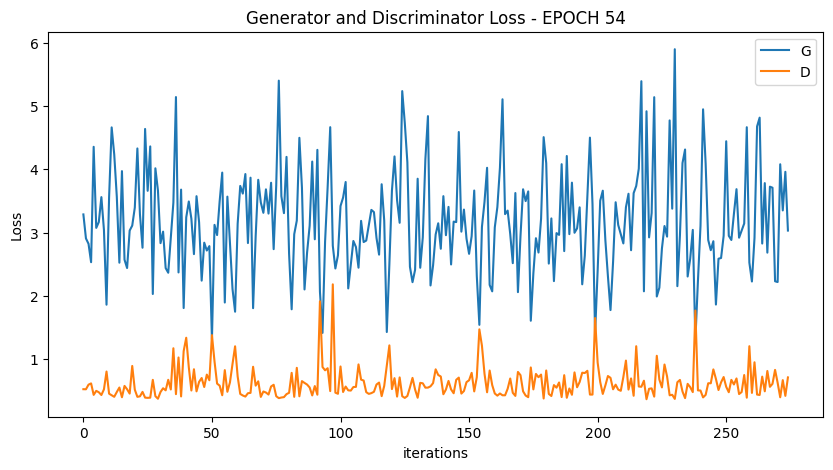

  0%|          | 0/275 [00:00<?, ?it/s]

[56/100][137/275] Loss_D: 0.4886 Loss_G: 3.1669 D(x): 0.9598 D(G(z)): 0.0954 / 0.0401
[56/100][274/275] Loss_D: 1.1538 Loss_G: 4.0488 D(x): 0.3211 D(G(z)): 0.0036 / 0.0221


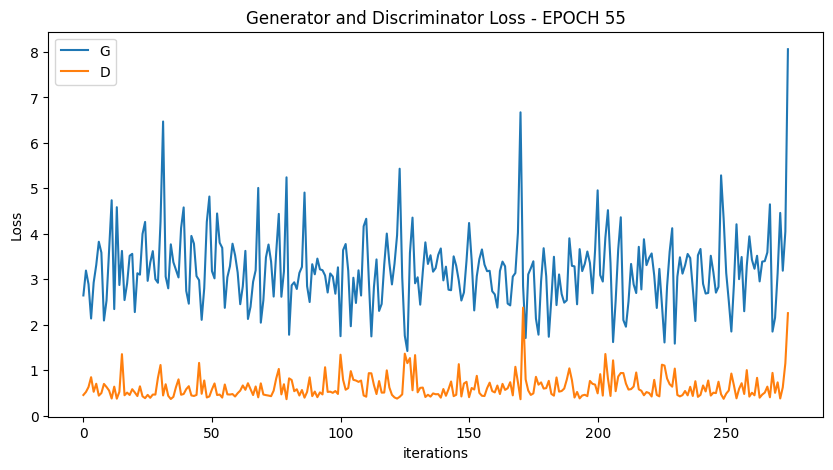

  0%|          | 0/275 [00:00<?, ?it/s]

[57/100][137/275] Loss_D: 0.5704 Loss_G: 2.4856 D(x): 0.7208 D(G(z)): 0.0677 / 0.0781
[57/100][274/275] Loss_D: 0.5566 Loss_G: 3.2995 D(x): 0.7023 D(G(z)): 0.0214 / 0.0308


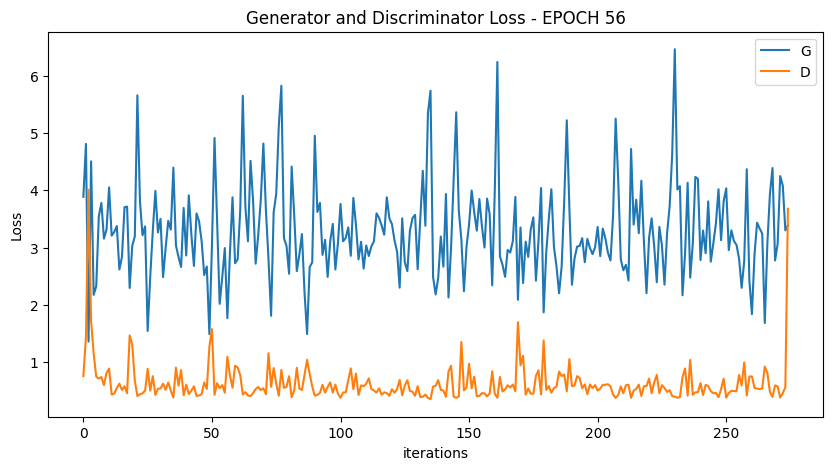

  0%|          | 0/275 [00:00<?, ?it/s]

[58/100][137/275] Loss_D: 1.0464 Loss_G: 2.8358 D(x): 0.4195 D(G(z)): 0.0242 / 0.0789
[58/100][274/275] Loss_D: 0.9220 Loss_G: 4.8032 D(x): 0.4519 D(G(z)): 0.0057 / 0.0077


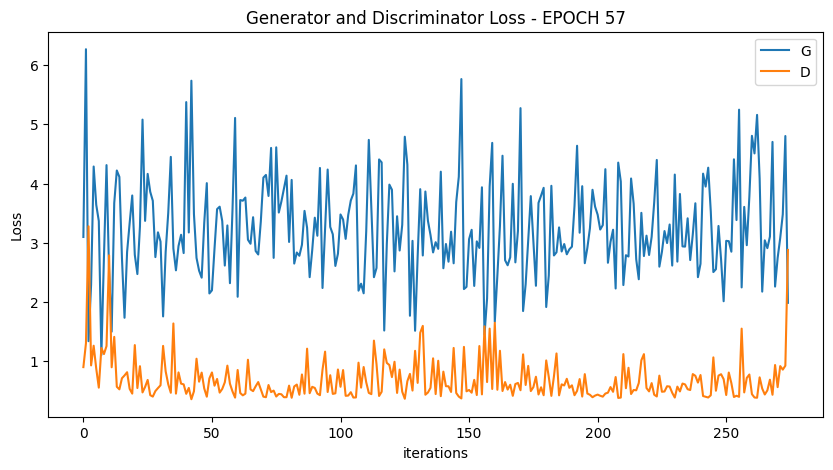

  0%|          | 0/275 [00:00<?, ?it/s]

[59/100][137/275] Loss_D: 0.5973 Loss_G: 2.4665 D(x): 0.8406 D(G(z)): 0.1917 / 0.0779
[59/100][274/275] Loss_D: 0.4739 Loss_G: 2.7455 D(x): 0.9029 D(G(z)): 0.1130 / 0.0616


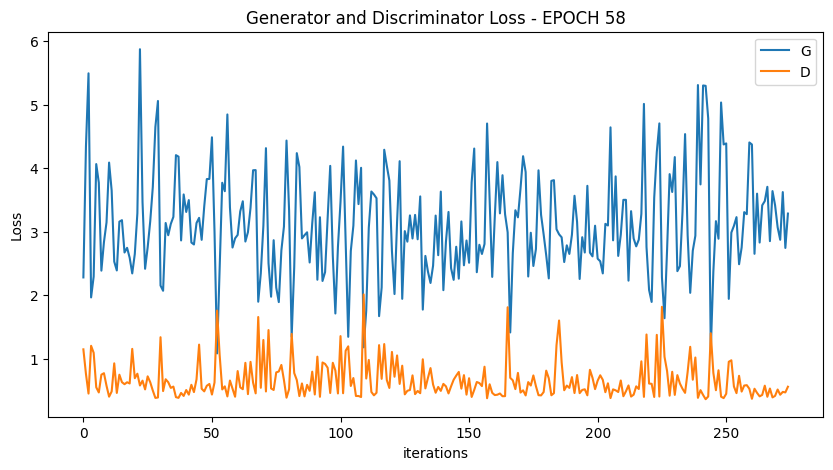

  0%|          | 0/275 [00:00<?, ?it/s]

[60/100][137/275] Loss_D: 0.6723 Loss_G: 2.8145 D(x): 0.8977 D(G(z)): 0.2540 / 0.0523
[60/100][274/275] Loss_D: 0.5873 Loss_G: 3.1732 D(x): 0.9500 D(G(z)): 0.1758 / 0.0338


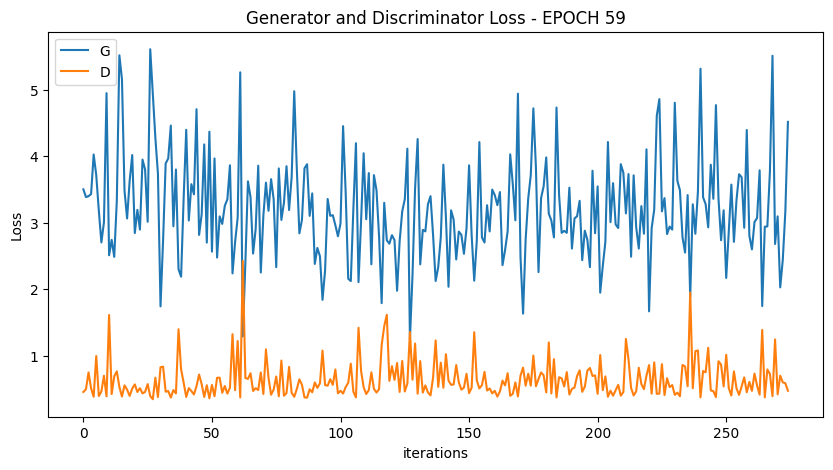

  0%|          | 0/275 [00:00<?, ?it/s]

[61/100][137/275] Loss_D: 0.4384 Loss_G: 3.0393 D(x): 0.8835 D(G(z)): 0.0771 / 0.0482
[61/100][274/275] Loss_D: 0.5320 Loss_G: 2.8659 D(x): 0.7664 D(G(z)): 0.0775 / 0.0586


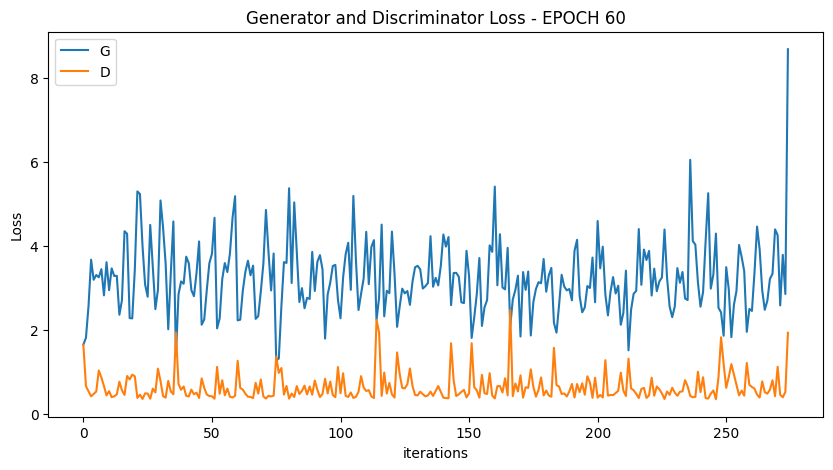

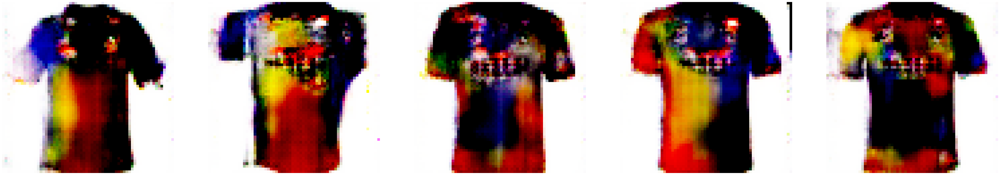

  0%|          | 0/275 [00:00<?, ?it/s]

[62/100][137/275] Loss_D: 0.4973 Loss_G: 4.7620 D(x): 0.9892 D(G(z)): 0.0110 / 0.0080
[62/100][274/275] Loss_D: 0.7470 Loss_G: 2.5273 D(x): 0.9240 D(G(z)): 0.3184 / 0.0683


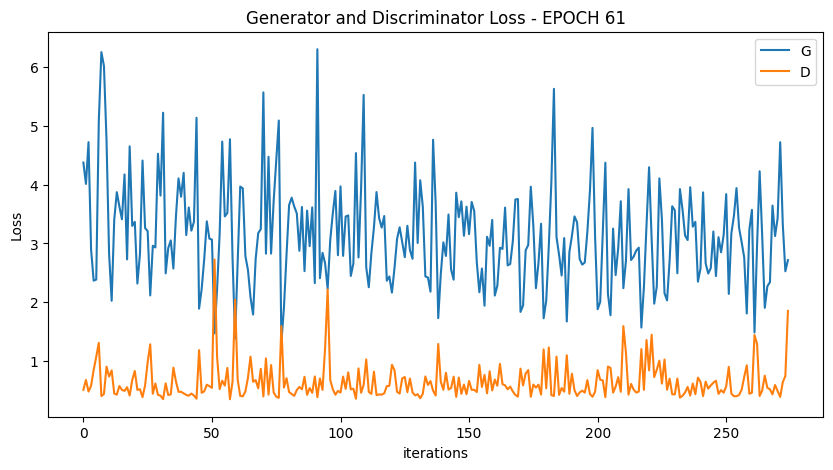

  0%|          | 0/275 [00:00<?, ?it/s]

[63/100][137/275] Loss_D: 0.4640 Loss_G: 4.2784 D(x): 0.7558 D(G(z)): 0.0098 / 0.0137
[63/100][274/275] Loss_D: 0.8631 Loss_G: 4.0892 D(x): 0.4442 D(G(z)): 0.0040 / 0.0146


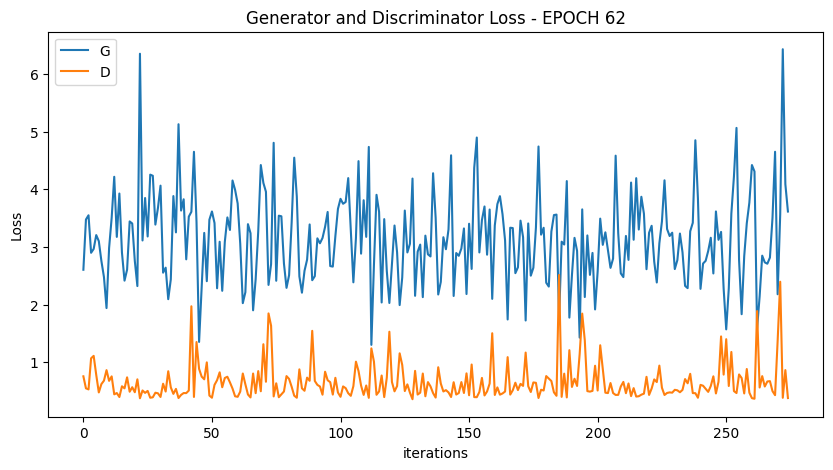

  0%|          | 0/275 [00:00<?, ?it/s]

[64/100][137/275] Loss_D: 0.4707 Loss_G: 2.9269 D(x): 0.8258 D(G(z)): 0.0819 / 0.0554
[64/100][274/275] Loss_D: 0.4532 Loss_G: 4.1908 D(x): 0.7968 D(G(z)): 0.0532 / 0.0149


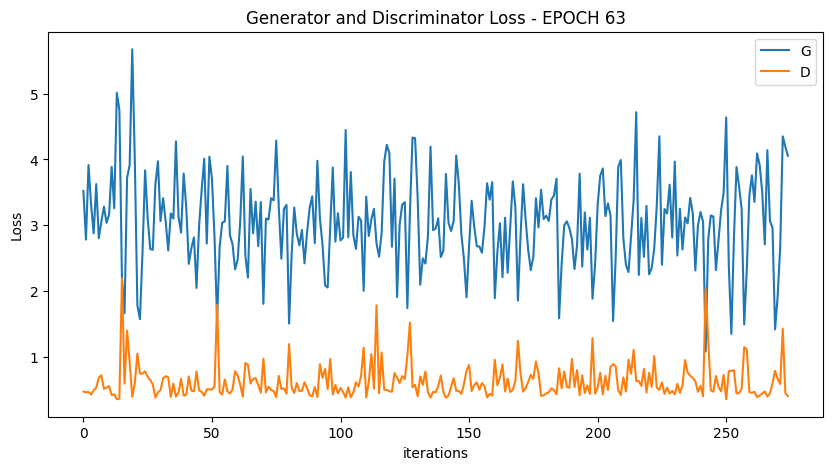

  0%|          | 0/275 [00:00<?, ?it/s]

[65/100][137/275] Loss_D: 0.7915 Loss_G: 2.3191 D(x): 0.6863 D(G(z)): 0.2452 / 0.0923
[65/100][274/275] Loss_D: 0.6620 Loss_G: 2.8749 D(x): 0.8935 D(G(z)): 0.2387 / 0.0504


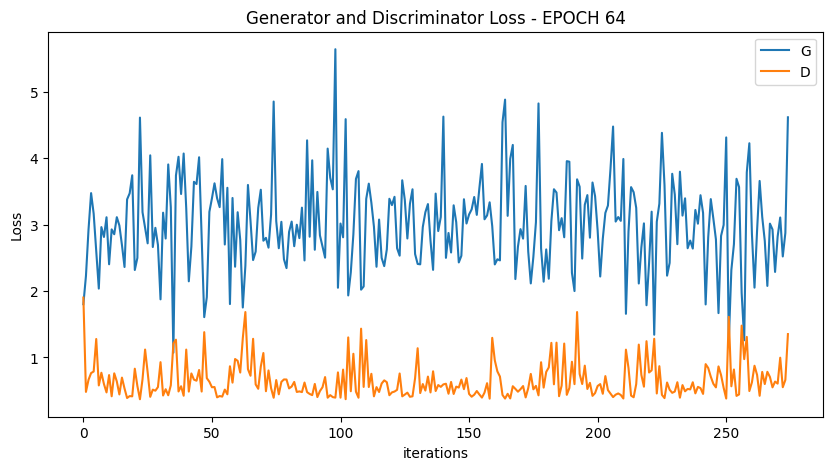

  0%|          | 0/275 [00:00<?, ?it/s]

[66/100][137/275] Loss_D: 0.5515 Loss_G: 2.9188 D(x): 0.6599 D(G(z)): 0.0299 / 0.0612
[66/100][274/275] Loss_D: 0.4576 Loss_G: 3.0665 D(x): 0.9031 D(G(z)): 0.0904 / 0.0506


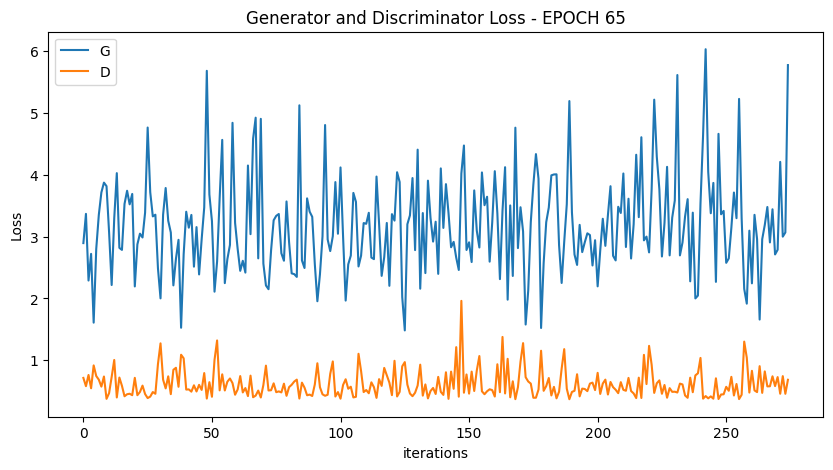

  0%|          | 0/275 [00:00<?, ?it/s]

[67/100][137/275] Loss_D: 0.5710 Loss_G: 3.5233 D(x): 0.7823 D(G(z)): 0.0723 / 0.0284
[67/100][274/275] Loss_D: 0.6670 Loss_G: 3.4177 D(x): 0.9781 D(G(z)): 0.1919 / 0.0338


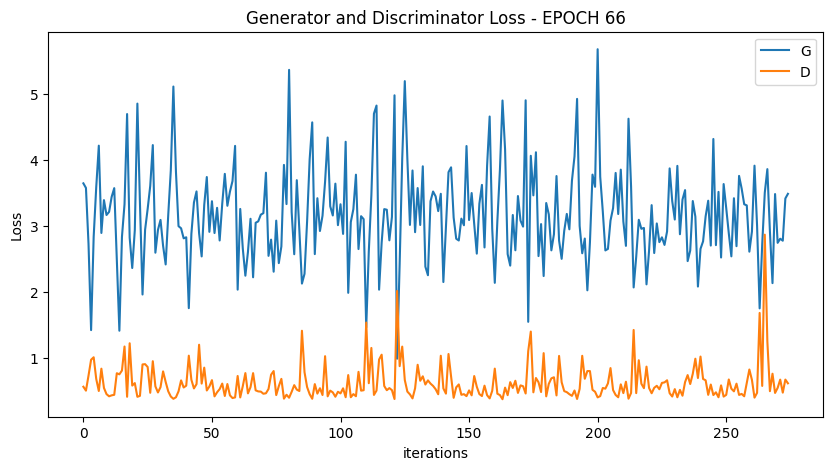

  0%|          | 0/275 [00:00<?, ?it/s]

[68/100][137/275] Loss_D: 0.5026 Loss_G: 2.6894 D(x): 0.7516 D(G(z)): 0.0558 / 0.0779
[68/100][274/275] Loss_D: 0.4523 Loss_G: 3.0143 D(x): 0.8237 D(G(z)): 0.0741 / 0.0493


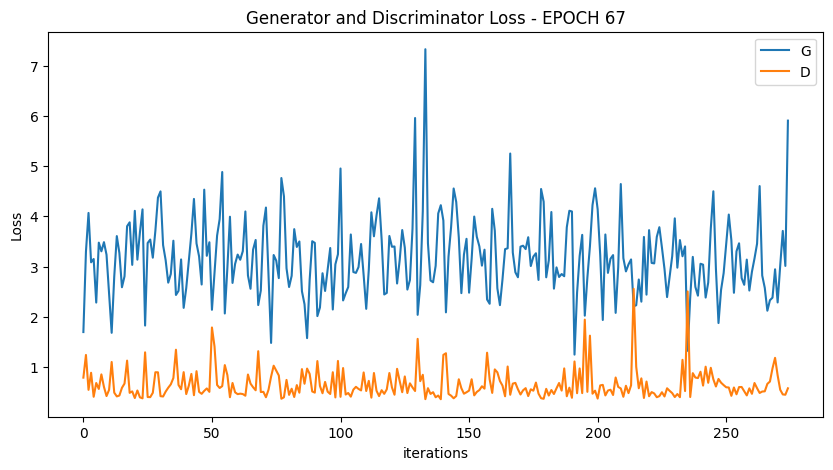

  0%|          | 0/275 [00:00<?, ?it/s]

[69/100][137/275] Loss_D: 0.5067 Loss_G: 4.1163 D(x): 0.9639 D(G(z)): 0.0907 / 0.0149
[69/100][274/275] Loss_D: 0.5025 Loss_G: 3.9363 D(x): 0.7072 D(G(z)): 0.0188 / 0.0176


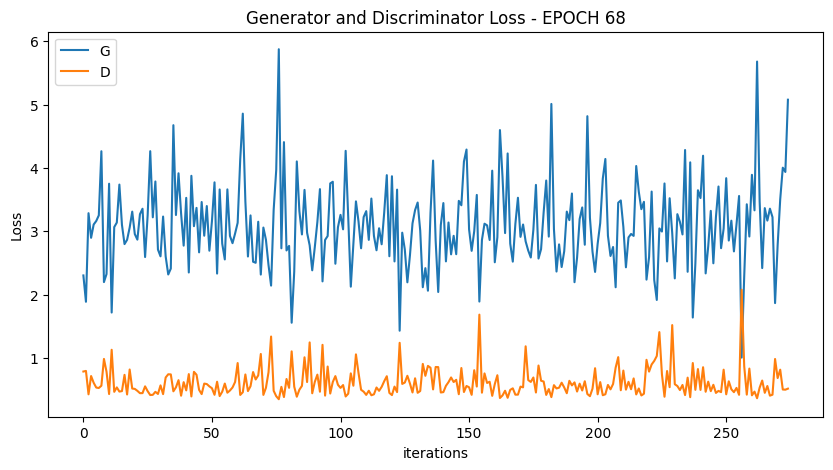

  0%|          | 0/275 [00:00<?, ?it/s]

[70/100][137/275] Loss_D: 0.5561 Loss_G: 3.7366 D(x): 0.6464 D(G(z)): 0.0106 / 0.0298
[70/100][274/275] Loss_D: 0.5792 Loss_G: 2.8823 D(x): 0.7493 D(G(z)): 0.1116 / 0.0614


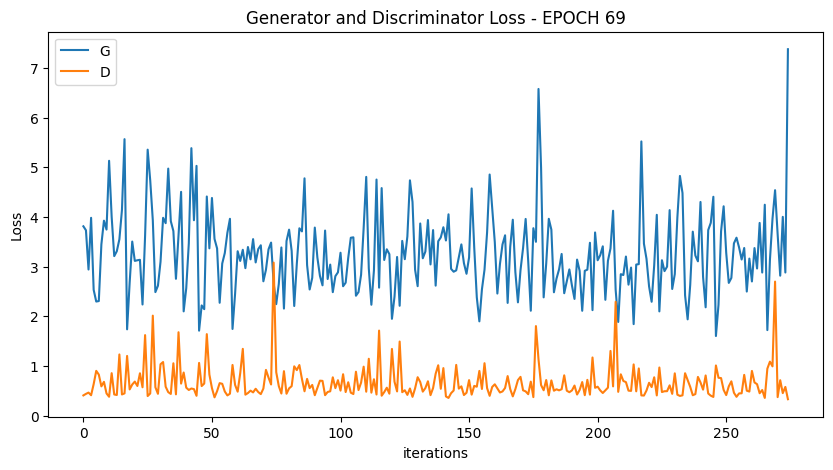

  0%|          | 0/275 [00:00<?, ?it/s]

[71/100][137/275] Loss_D: 0.5928 Loss_G: 2.8224 D(x): 0.7906 D(G(z)): 0.1449 / 0.0554
[71/100][274/275] Loss_D: 0.4763 Loss_G: 2.7747 D(x): 0.8986 D(G(z)): 0.1037 / 0.0552


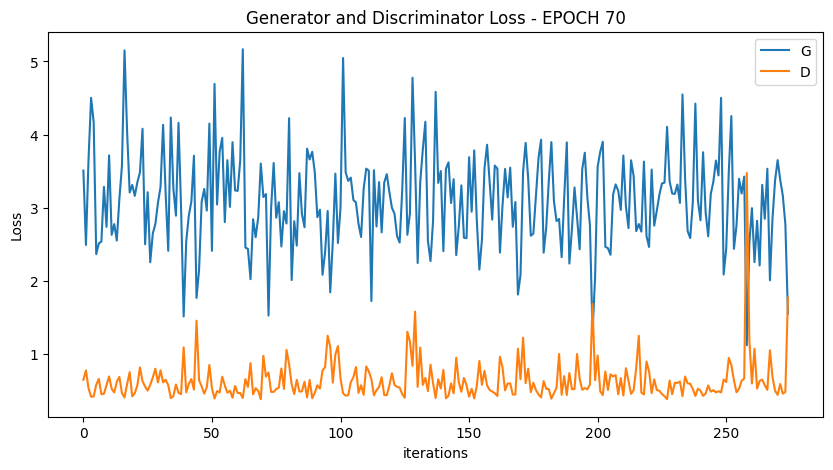

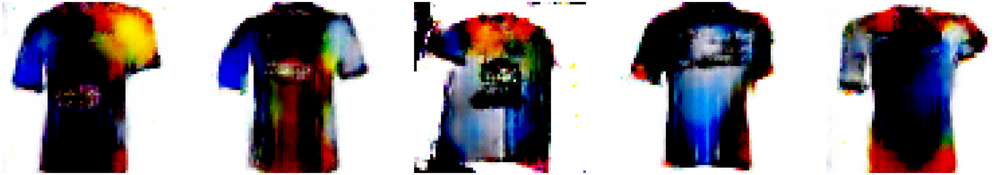

  0%|          | 0/275 [00:00<?, ?it/s]

[72/100][137/275] Loss_D: 0.4582 Loss_G: 3.2423 D(x): 0.9557 D(G(z)): 0.0680 / 0.0374
[72/100][274/275] Loss_D: 0.7544 Loss_G: 2.5407 D(x): 0.7157 D(G(z)): 0.2169 / 0.0700


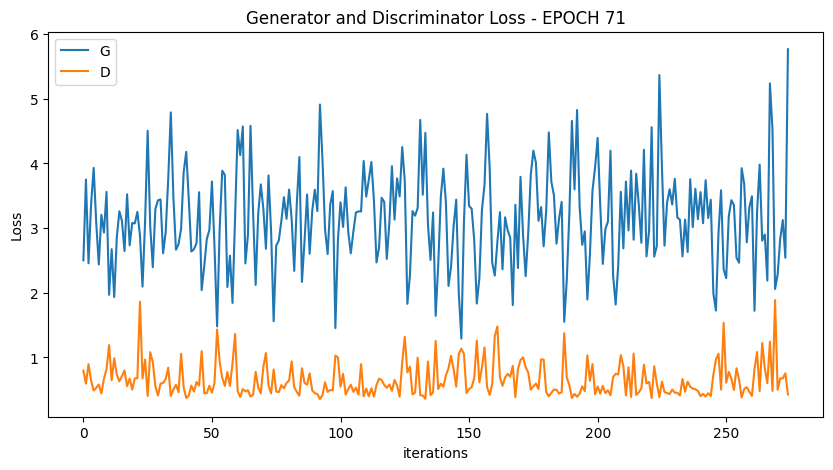

  0%|          | 0/275 [00:00<?, ?it/s]

[73/100][137/275] Loss_D: 0.4723 Loss_G: 3.1154 D(x): 0.8808 D(G(z)): 0.0854 / 0.0416
[73/100][274/275] Loss_D: 0.5550 Loss_G: 3.2353 D(x): 0.6900 D(G(z)): 0.0400 / 0.0388


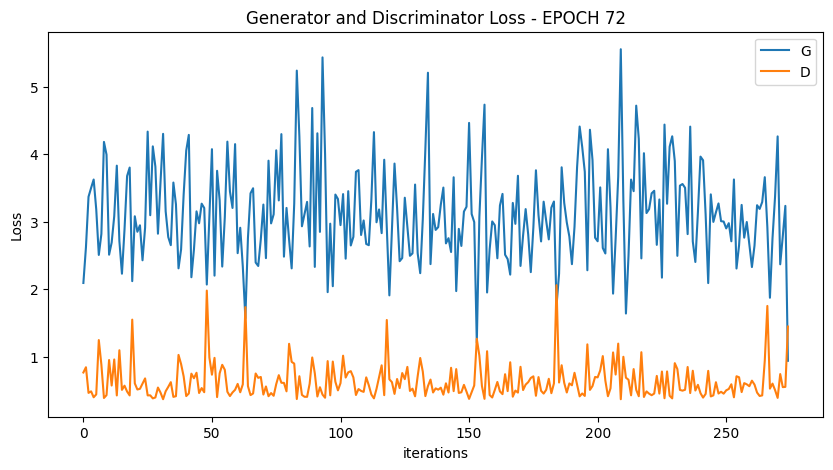

  0%|          | 0/275 [00:00<?, ?it/s]

[74/100][137/275] Loss_D: 0.4349 Loss_G: 3.8654 D(x): 0.8451 D(G(z)): 0.0553 / 0.0203
[74/100][274/275] Loss_D: 1.2948 Loss_G: 3.7300 D(x): 0.2925 D(G(z)): 0.0055 / 0.0274


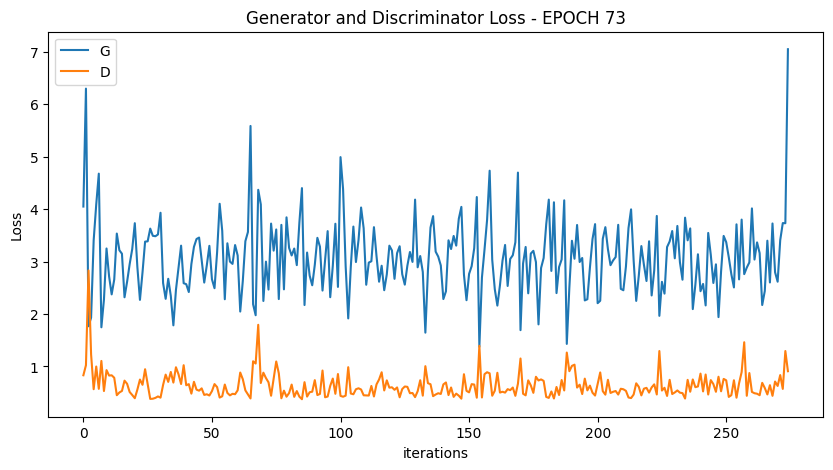

  0%|          | 0/275 [00:00<?, ?it/s]

[75/100][137/275] Loss_D: 0.9379 Loss_G: 1.9242 D(x): 0.5951 D(G(z)): 0.2291 / 0.1580
[75/100][274/275] Loss_D: 0.5631 Loss_G: 3.1229 D(x): 0.8676 D(G(z)): 0.1763 / 0.0418


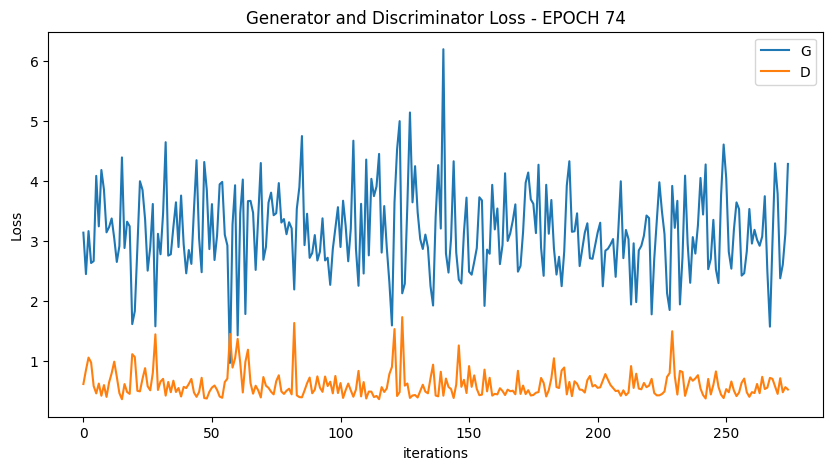

  0%|          | 0/275 [00:00<?, ?it/s]

[76/100][137/275] Loss_D: 0.6839 Loss_G: 2.5345 D(x): 0.7135 D(G(z)): 0.0795 / 0.0804
[76/100][274/275] Loss_D: 0.3871 Loss_G: 4.0208 D(x): 0.8505 D(G(z)): 0.0140 / 0.0190


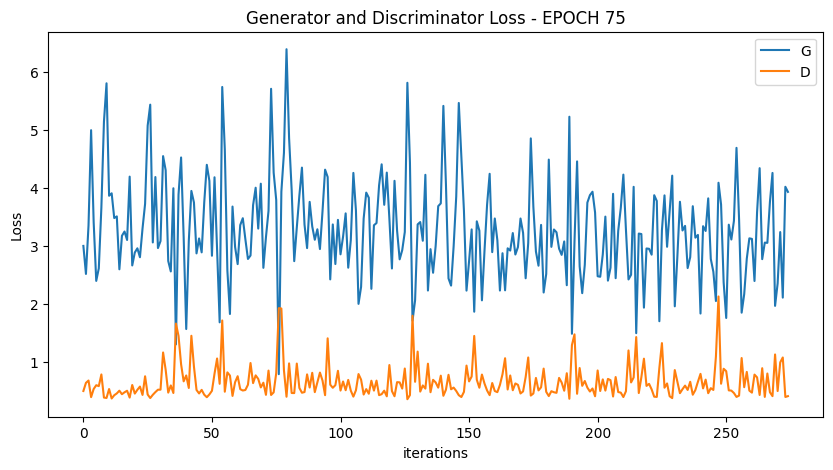

  0%|          | 0/275 [00:00<?, ?it/s]

[77/100][137/275] Loss_D: 0.4287 Loss_G: 3.5001 D(x): 0.8706 D(G(z)): 0.0583 / 0.0302
[77/100][274/275] Loss_D: 0.3981 Loss_G: 3.8327 D(x): 0.9147 D(G(z)): 0.0421 / 0.0184


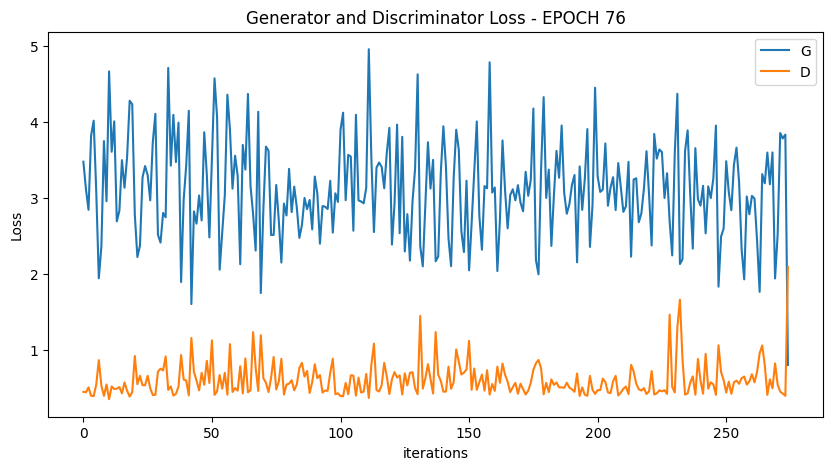

  0%|          | 0/275 [00:00<?, ?it/s]

[78/100][137/275] Loss_D: 0.4932 Loss_G: 2.1287 D(x): 0.7911 D(G(z)): 0.0698 / 0.1191
[78/100][274/275] Loss_D: 0.5757 Loss_G: 2.6788 D(x): 0.8380 D(G(z)): 0.1691 / 0.0644


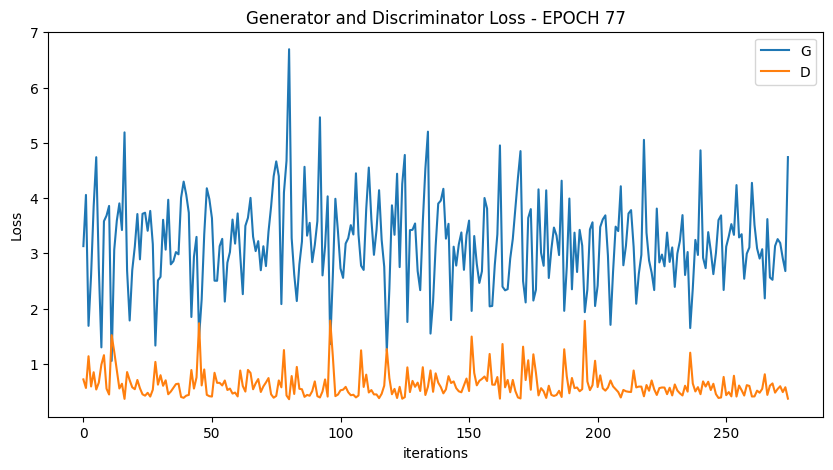

  0%|          | 0/275 [00:00<?, ?it/s]

[79/100][137/275] Loss_D: 0.7325 Loss_G: 2.4693 D(x): 0.5392 D(G(z)): 0.0294 / 0.0937
[79/100][274/275] Loss_D: 0.7612 Loss_G: 3.3008 D(x): 0.9795 D(G(z)): 0.2256 / 0.0368


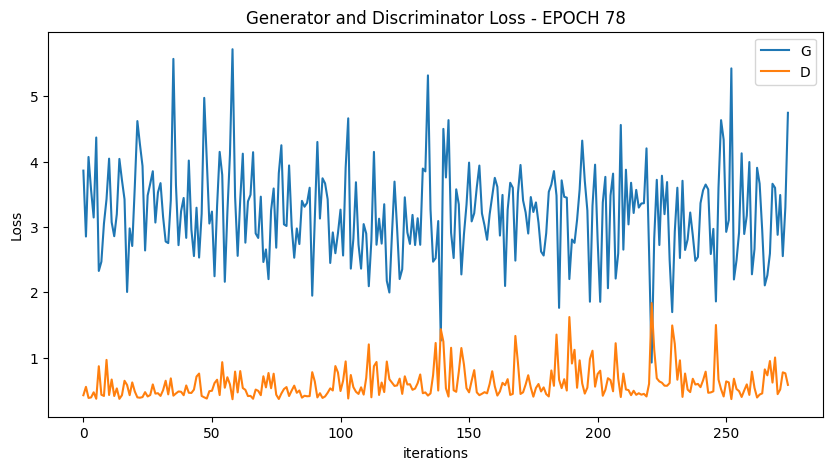

  0%|          | 0/275 [00:00<?, ?it/s]

[80/100][137/275] Loss_D: 0.5022 Loss_G: 3.8465 D(x): 0.8345 D(G(z)): 0.0760 / 0.0205
[80/100][274/275] Loss_D: 0.4633 Loss_G: 3.2821 D(x): 0.9149 D(G(z)): 0.0985 / 0.0326


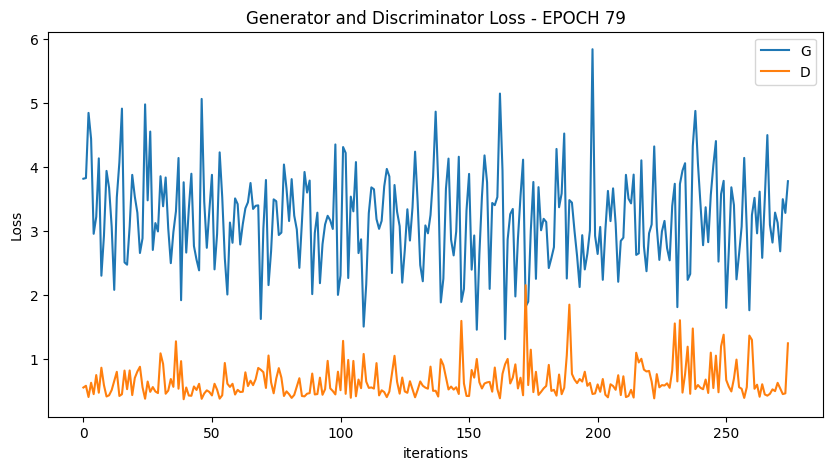

  0%|          | 0/275 [00:00<?, ?it/s]

[81/100][137/275] Loss_D: 0.6070 Loss_G: 3.5064 D(x): 0.9479 D(G(z)): 0.1765 / 0.0279
[81/100][274/275] Loss_D: 0.4283 Loss_G: 3.3429 D(x): 0.8596 D(G(z)): 0.0524 / 0.0327


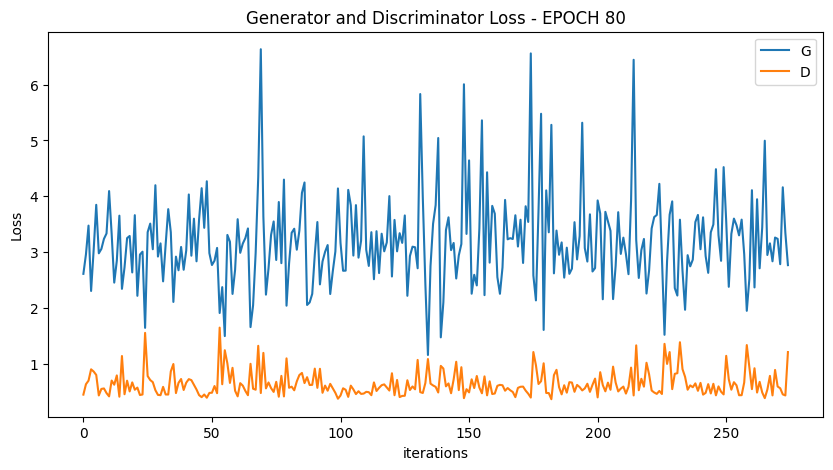

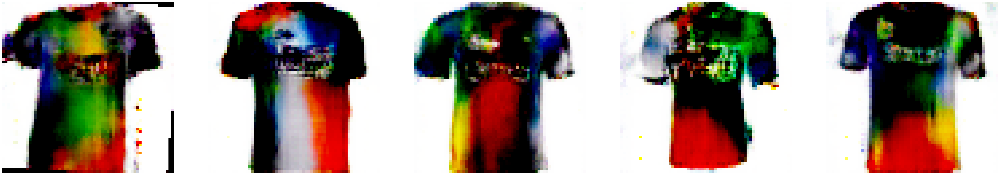

  0%|          | 0/275 [00:00<?, ?it/s]

[82/100][137/275] Loss_D: 0.6625 Loss_G: 3.8522 D(x): 0.6688 D(G(z)): 0.0206 / 0.0215
[82/100][274/275] Loss_D: 0.9020 Loss_G: 2.1310 D(x): 0.4539 D(G(z)): 0.0488 / 0.1365


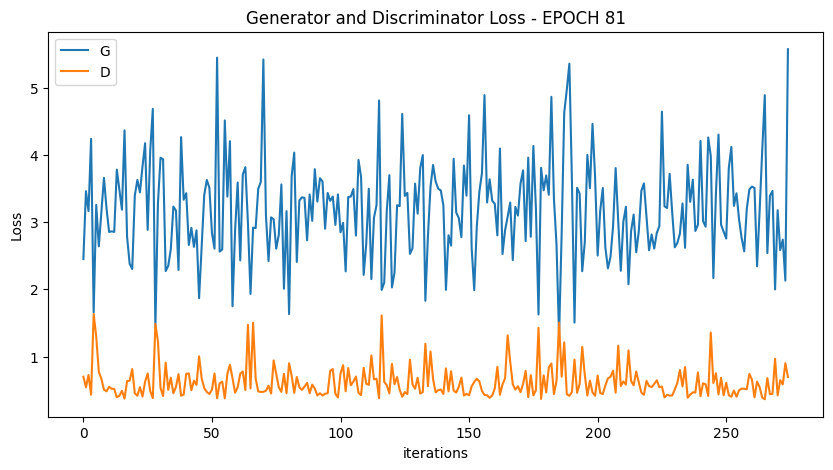

  0%|          | 0/275 [00:00<?, ?it/s]

[83/100][137/275] Loss_D: 0.5048 Loss_G: 2.4762 D(x): 0.9323 D(G(z)): 0.1192 / 0.0826
[83/100][274/275] Loss_D: 0.8743 Loss_G: 3.2313 D(x): 0.4593 D(G(z)): 0.0120 / 0.0393


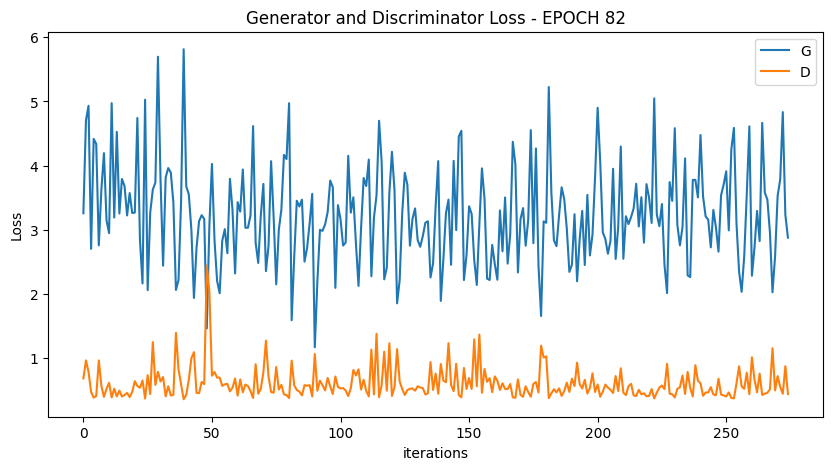

  0%|          | 0/275 [00:00<?, ?it/s]

[84/100][137/275] Loss_D: 0.4983 Loss_G: 4.6903 D(x): 0.7108 D(G(z)): 0.0129 / 0.0093
[84/100][274/275] Loss_D: 0.9856 Loss_G: 2.0401 D(x): 0.5259 D(G(z)): 0.2184 / 0.1482


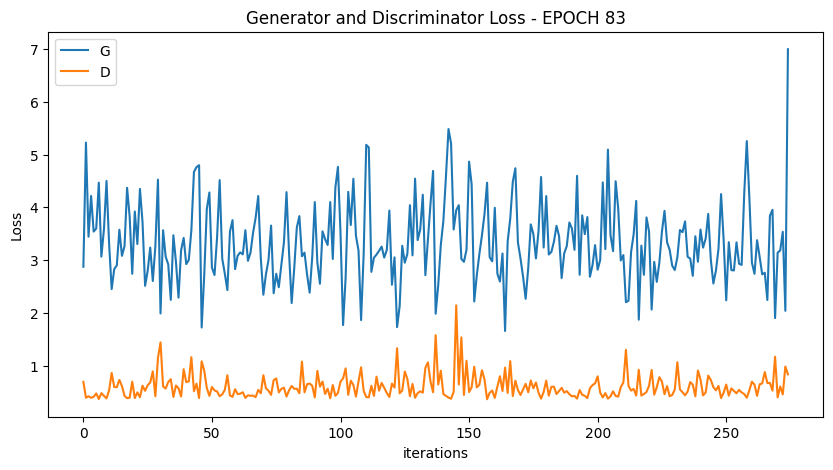

  0%|          | 0/275 [00:00<?, ?it/s]

[85/100][137/275] Loss_D: 0.6196 Loss_G: 2.4600 D(x): 0.7382 D(G(z)): 0.1411 / 0.0932
[85/100][274/275] Loss_D: 0.5295 Loss_G: 2.7319 D(x): 0.8227 D(G(z)): 0.1148 / 0.0667


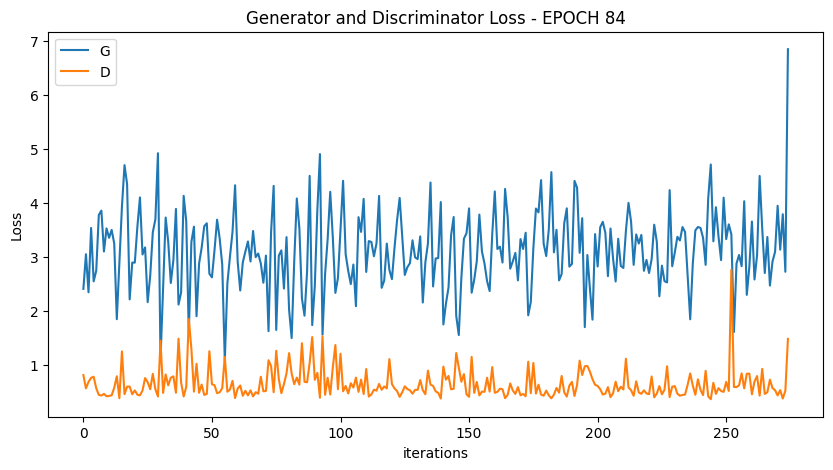

  0%|          | 0/275 [00:00<?, ?it/s]

[86/100][137/275] Loss_D: 0.8716 Loss_G: 2.0915 D(x): 0.5329 D(G(z)): 0.1448 / 0.1453
[86/100][274/275] Loss_D: 1.3154 Loss_G: 1.4767 D(x): 0.3156 D(G(z)): 0.0574 / 0.2421


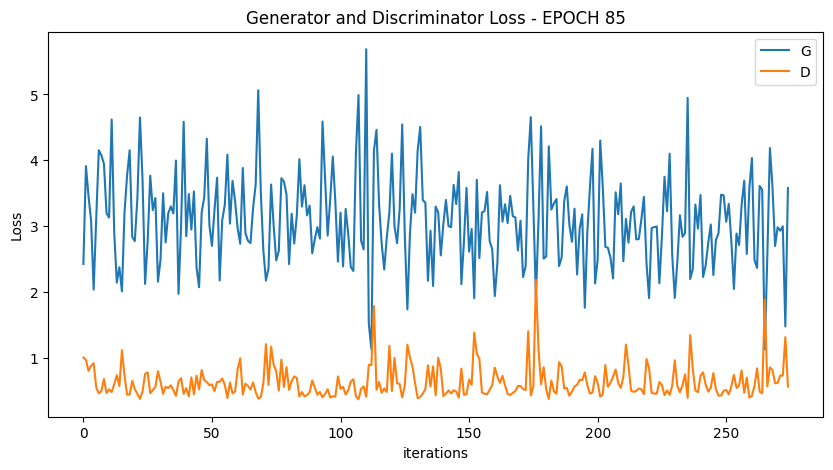

  0%|          | 0/275 [00:00<?, ?it/s]

[87/100][137/275] Loss_D: 0.4867 Loss_G: 3.0804 D(x): 0.8316 D(G(z)): 0.0941 / 0.0411
[87/100][274/275] Loss_D: 0.6190 Loss_G: 3.1771 D(x): 0.6053 D(G(z)): 0.0210 / 0.0555


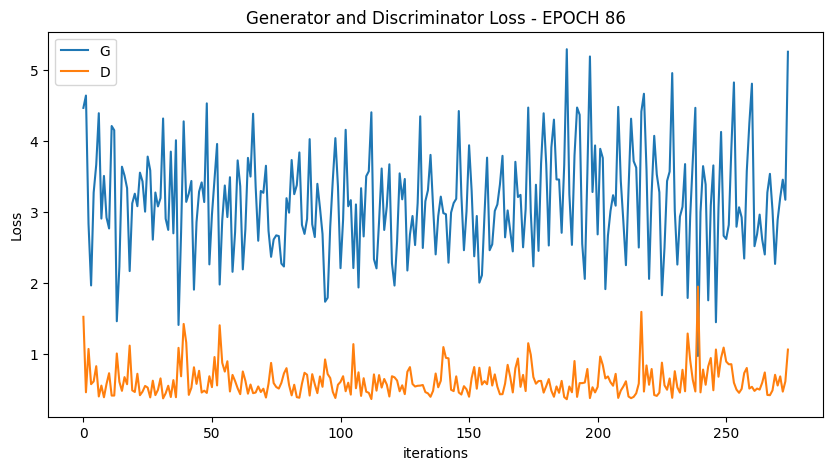

  0%|          | 0/275 [00:00<?, ?it/s]

[88/100][137/275] Loss_D: 0.5056 Loss_G: 3.5913 D(x): 0.7637 D(G(z)): 0.0534 / 0.0263
[88/100][274/275] Loss_D: 0.9663 Loss_G: 2.2014 D(x): 0.4735 D(G(z)): 0.0992 / 0.1086


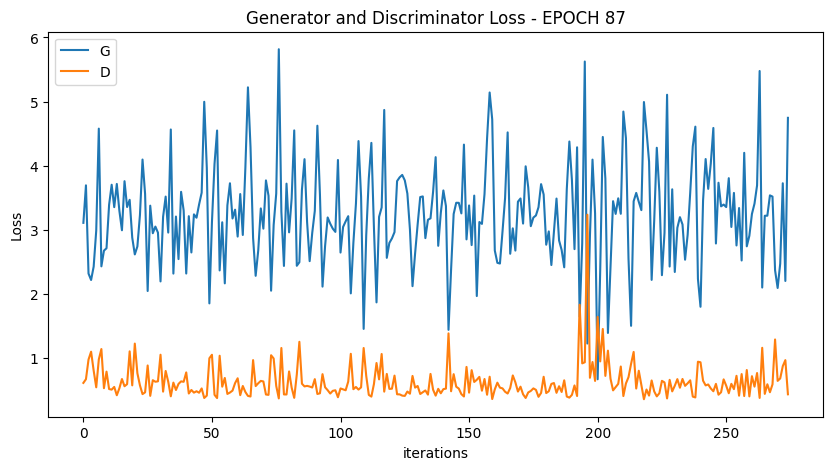

  0%|          | 0/275 [00:00<?, ?it/s]

[89/100][137/275] Loss_D: 0.8839 Loss_G: 3.1238 D(x): 0.9828 D(G(z)): 0.2882 / 0.0409
[89/100][274/275] Loss_D: 1.5672 Loss_G: 3.6307 D(x): 0.9653 D(G(z)): 0.6372 / 0.0258


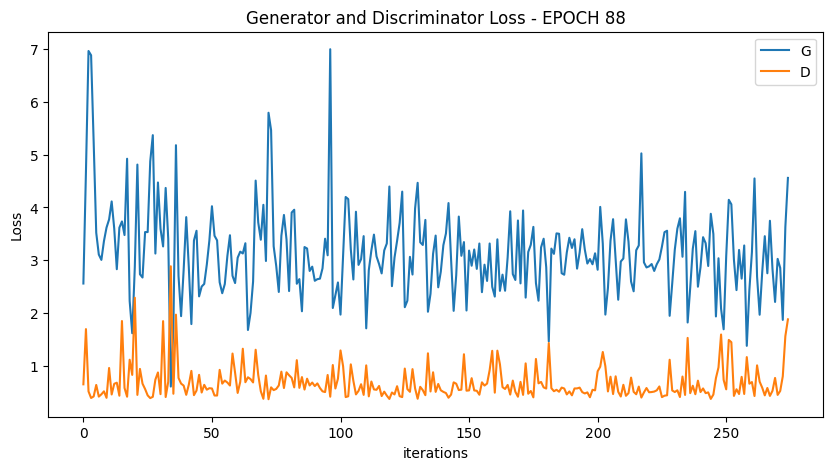

  0%|          | 0/275 [00:00<?, ?it/s]

[90/100][137/275] Loss_D: 0.7343 Loss_G: 3.3817 D(x): 0.5520 D(G(z)): 0.0116 / 0.0363
[90/100][274/275] Loss_D: 0.4323 Loss_G: 2.9369 D(x): 0.8615 D(G(z)): 0.0540 / 0.0515


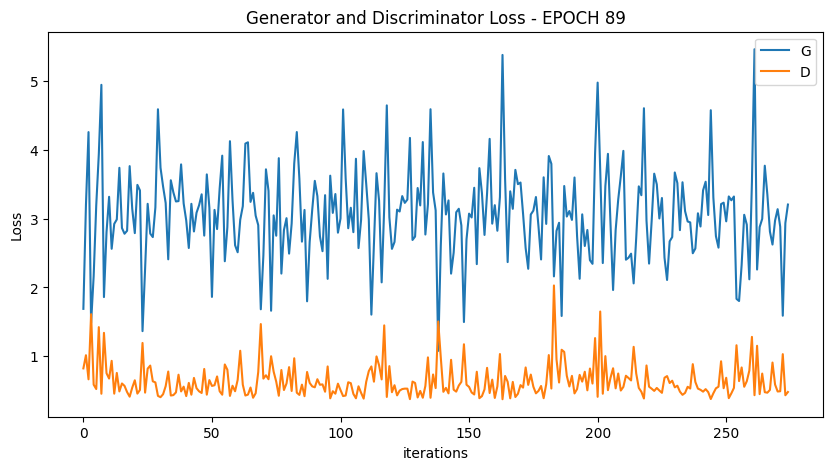

  0%|          | 0/275 [00:00<?, ?it/s]

[91/100][137/275] Loss_D: 0.4467 Loss_G: 3.4482 D(x): 0.9238 D(G(z)): 0.0718 / 0.0296
[91/100][274/275] Loss_D: 0.4313 Loss_G: 3.1830 D(x): 0.8145 D(G(z)): 0.0309 / 0.0421


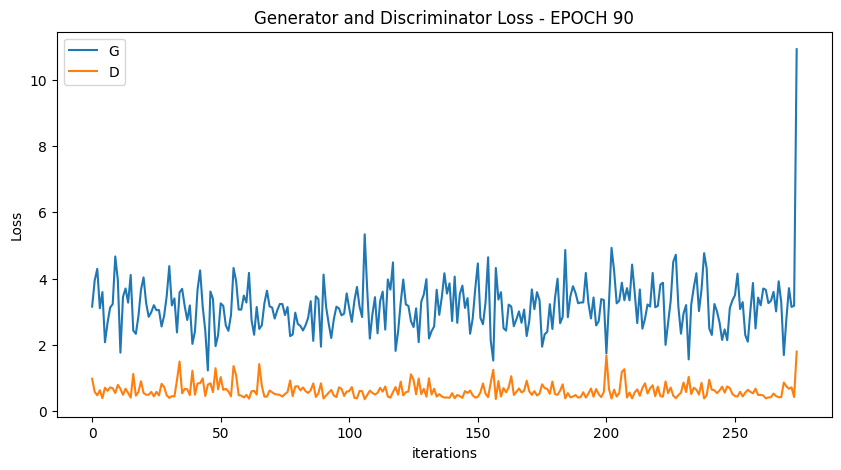

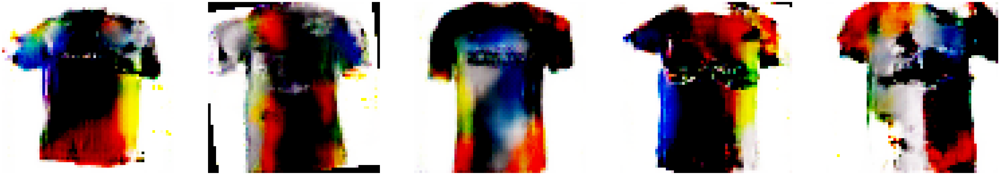

  0%|          | 0/275 [00:00<?, ?it/s]

[92/100][137/275] Loss_D: 0.5317 Loss_G: 2.2318 D(x): 0.8310 D(G(z)): 0.1027 / 0.1062
[92/100][274/275] Loss_D: 0.5225 Loss_G: 2.9204 D(x): 0.7073 D(G(z)): 0.0495 / 0.0485


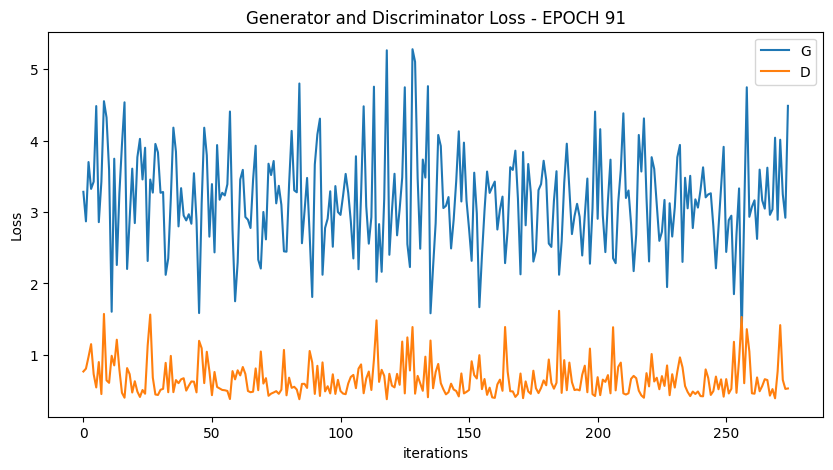

  0%|          | 0/275 [00:00<?, ?it/s]

[93/100][137/275] Loss_D: 0.4067 Loss_G: 3.6414 D(x): 0.8414 D(G(z)): 0.0203 / 0.0229
[93/100][274/275] Loss_D: 0.5580 Loss_G: 3.0483 D(x): 0.6461 D(G(z)): 0.0236 / 0.0518


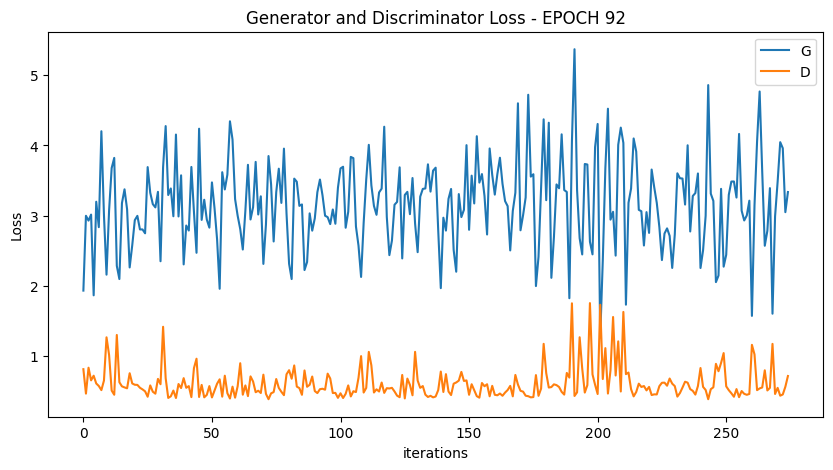

  0%|          | 0/275 [00:00<?, ?it/s]

[94/100][137/275] Loss_D: 0.4818 Loss_G: 3.6761 D(x): 0.7580 D(G(z)): 0.0407 / 0.0274
[94/100][274/275] Loss_D: 0.5762 Loss_G: 3.0023 D(x): 0.8116 D(G(z)): 0.1422 / 0.0452


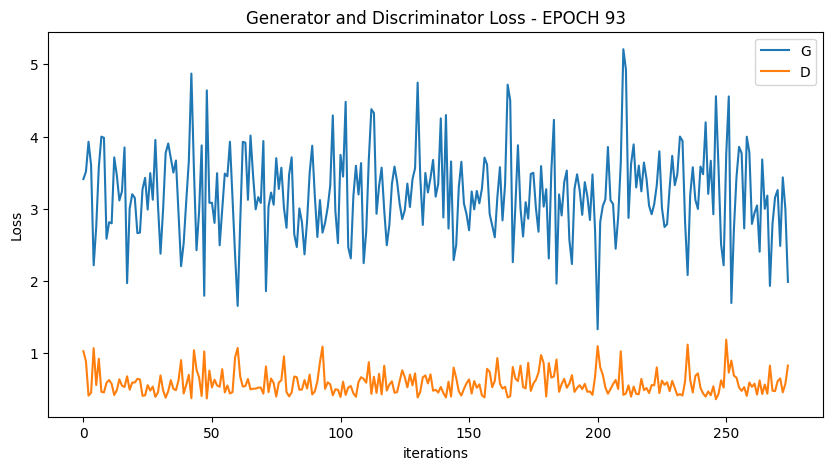

  0%|          | 0/275 [00:00<?, ?it/s]

[95/100][137/275] Loss_D: 0.8710 Loss_G: 1.9139 D(x): 0.5156 D(G(z)): 0.0811 / 0.1585
[95/100][274/275] Loss_D: 0.5504 Loss_G: 3.1802 D(x): 0.9509 D(G(z)): 0.1419 / 0.0391


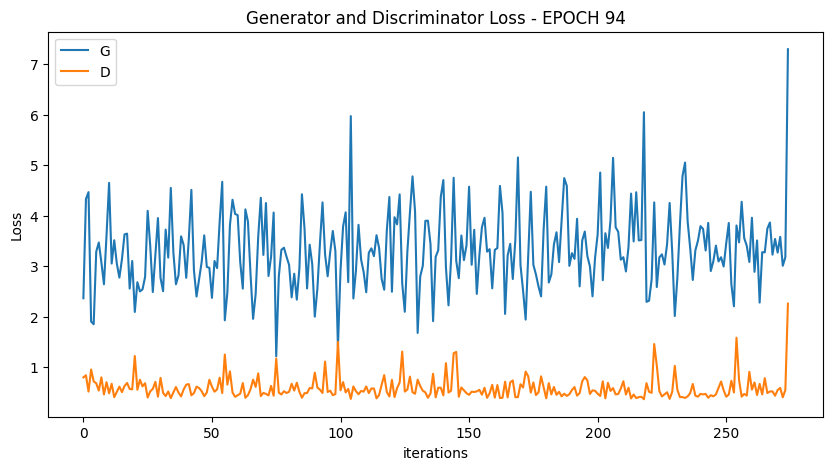

  0%|          | 0/275 [00:00<?, ?it/s]

[96/100][137/275] Loss_D: 0.6921 Loss_G: 2.9125 D(x): 0.5921 D(G(z)): 0.0541 / 0.0611
[96/100][274/275] Loss_D: 0.5097 Loss_G: 3.6388 D(x): 0.7096 D(G(z)): 0.0193 / 0.0228


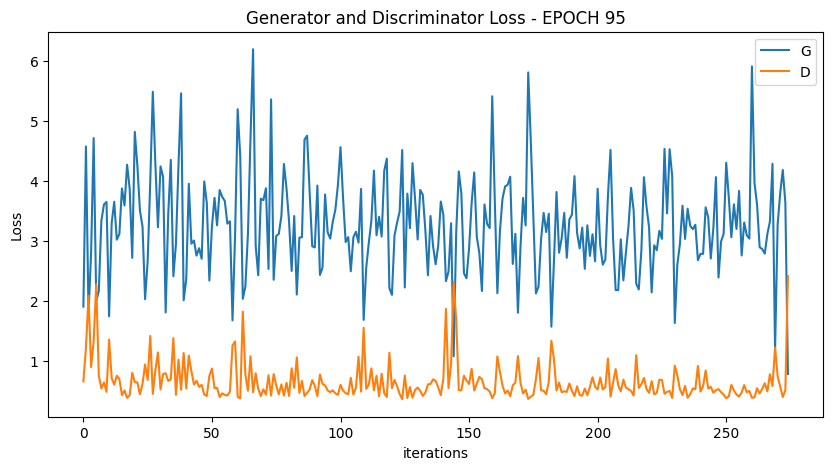

  0%|          | 0/275 [00:00<?, ?it/s]

[97/100][137/275] Loss_D: 1.3642 Loss_G: 3.3281 D(x): 0.9483 D(G(z)): 0.5347 / 0.0318
[97/100][274/275] Loss_D: 0.3830 Loss_G: 3.7056 D(x): 0.9204 D(G(z)): 0.0277 / 0.0268


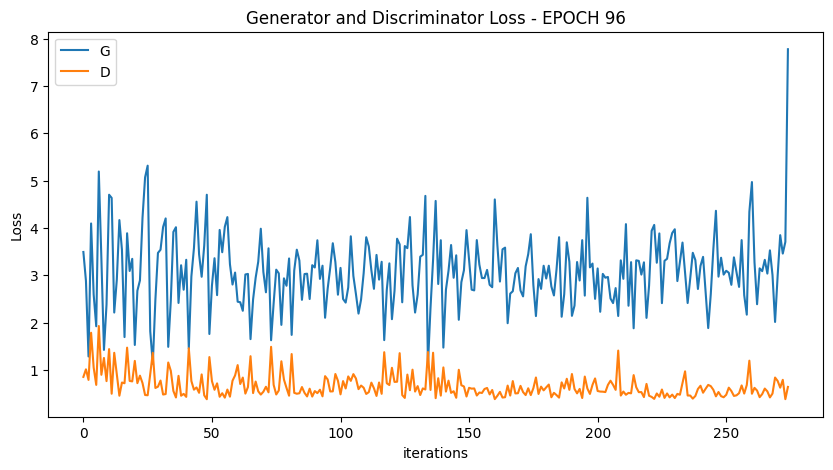

  0%|          | 0/275 [00:00<?, ?it/s]

[98/100][137/275] Loss_D: 1.0736 Loss_G: 2.1185 D(x): 0.4075 D(G(z)): 0.0690 / 0.1654
[98/100][274/275] Loss_D: 0.4221 Loss_G: 2.6993 D(x): 0.8467 D(G(z)): 0.0562 / 0.0750


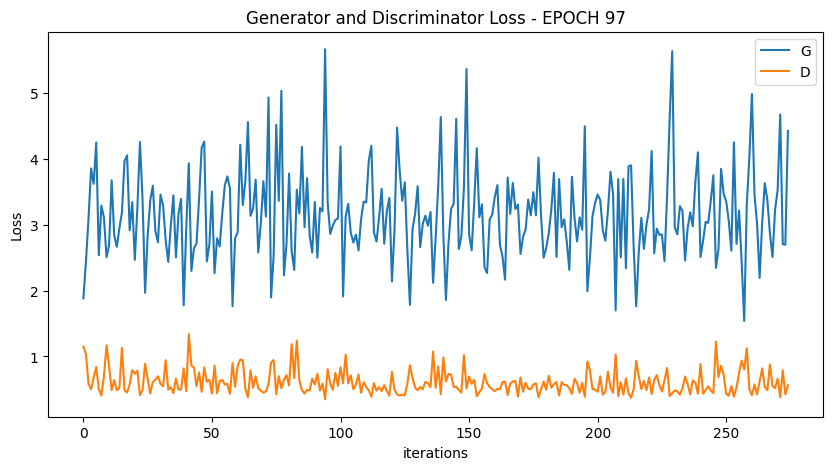

  0%|          | 0/275 [00:00<?, ?it/s]

[99/100][137/275] Loss_D: 0.5445 Loss_G: 3.2308 D(x): 0.9260 D(G(z)): 0.1546 / 0.0370
[99/100][274/275] Loss_D: 0.5745 Loss_G: 3.4125 D(x): 0.6473 D(G(z)): 0.0179 / 0.0357


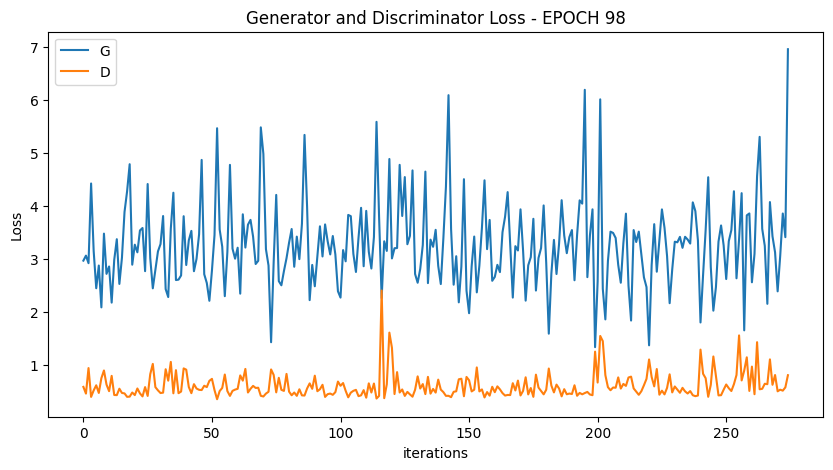

  0%|          | 0/275 [00:00<?, ?it/s]

[100/100][137/275] Loss_D: 1.3180 Loss_G: 3.7704 D(x): 0.3149 D(G(z)): 0.0043 / 0.0261
[100/100][274/275] Loss_D: 0.5082 Loss_G: 2.8453 D(x): 0.7716 D(G(z)): 0.0724 / 0.0785


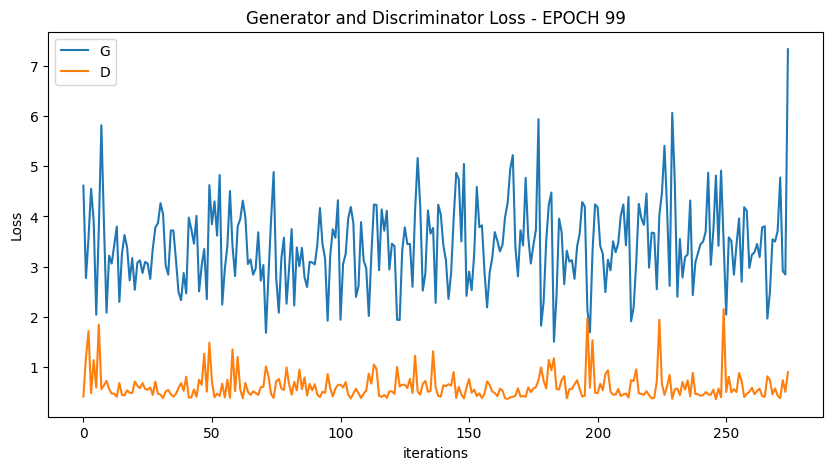

In [ ]:
for epoch in range(epochs):

    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        labels.fill_(real_label) 
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)

In [ ]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  84.7026567363739


# Generation example


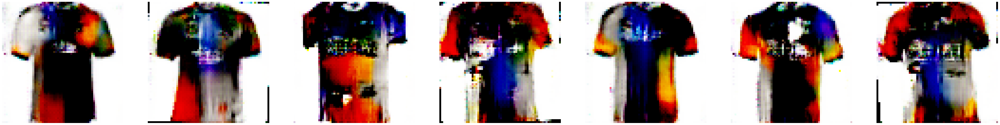

In [ ]:
show_generated_img(7)

In [ ]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
#can amend this to as many images as required to be saved after specifying output folder, for this project though I have relied on plt.imshow to show a range of the images produced (see next cell)
im_batch_size = 100
n_images=100

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

<ipython-input-41-24d58bd3678d>:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i_batch in tqdm(range(0, n_images, im_batch_size)):


  0%|          | 0/1 [00:00<?, ?it/s]

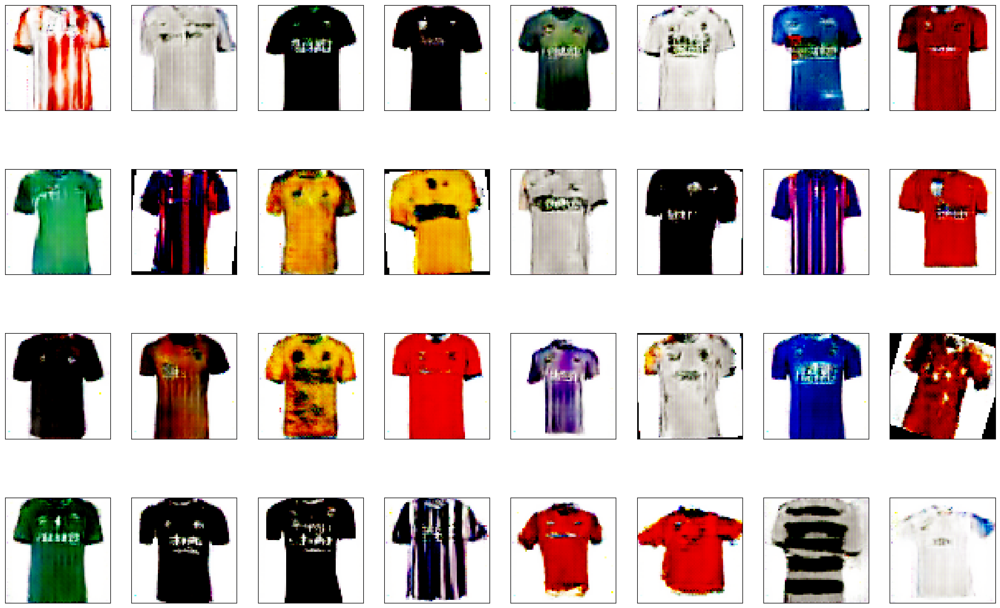

In [ ]:
fig = plt.figure(figsize=(25, 16))
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)